In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import json
# import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objects as go

import nltk
from nltk.corpus import wordnet 
nltk.download('stopwords')
from nltk.corpus import stopwords
# import spacy

import time
import string


# from sklearn.

# MODELS
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# EVALUATION METRICS and TOOLS
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import classification_report


# OTHER TOOLS
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import  HalvingGridSearchCV, RepeatedStratifiedKFold, cross_val_score, train_test_split

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

from utils import main as utils, plots, preprocessing


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\alhas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Needed functions

In [2]:

with open("data/id_to_label.json", "r") as f:
    # Write the dictionary to the file in JSON format
    id_to_label = json.load(f)

In [3]:
def get_related_words(words):
    related_words = set(words)
    for word in words:
        for sset in wordnet.synsets(word):
            
            for hypernym in sset.hypernyms():
                [related_words.add(n) for n in hypernym.lemma_names()]
        
            for hyponym in sset.hyponyms():
                [related_words.add(n) for n in hyponym.lemma_names()]

    return related_words

In [4]:
def train_model(model,
                X_train, y_train,
                X_test, y_test,                
                verbose=False):  
        
    if model == 'RF':
        clf = RandomForestClassifier(n_estimators=100)
    # pipe = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(max_iter=10000))  
    elif model == 'LR':
        clf = LogisticRegression(max_iter=10000)
    elif model == 'KN':
        clf = make_pipeline(StandardScaler(with_mean=False),
             KNeighborsClassifier(n_neighbors=16))

    if verbose:
        print("#"*10, f"Training {clf.__class__.__name__}\n")
    
    clf.fit(X_train, y_train)
    
    
    score = clf.score(X_test, y_test)
    pred = clf.predict(X_test)
    
    
    if verbose:
        print("#"*10, score)
    
    
    return clf, pred, score

In [5]:
def run(models=['LR', 'RF', 'KN'], **kwargs):
    # for cat in categories:
# for cat in [224, 226]:
    # print(cat)
    
    exact = kwargs.get('exact') and kwargs.get('specific_cat')
    kwargs['exact'] = exact
    
    # Load data
    df, X_train, X_test, y_train, y_test, feature_names, target_names = utils.load_dataset('data/en_data.csv',
                                                                                           target_label='ocms',
                                                                                           **kwargs)
    
    
    if kwargs.get('verbose'):
        sns.histplot([f'{id_to_label[i]} ({i})' for i in df['ocms']])
        plt.xticks(rotation=90)
        plt.show()
            
        
    dfs = []
    df_out = df.loc[y_test.index]
    # Run models
    for model in models:
        print('#'*10, kwargs.get('cat'), model, '\n')
            
        clf, pred, score = train_model(model, 
                                       X_train, y_train,
                                       X_test, y_test,
                                       verbose=True
                                       )
        
        y_pred  = pd.DataFrame(pred)

        # df_out = X_test.reset_index()
        # df_out["Actual"] = y_test.reset_index()["ocms"]
        # df_out["Prediction"] = y_pred.reset_index()[0]


#         y_test['preds'] = y_pred

#         df_out = pd.merge(df,y_test[['preds']],how = 'left',left_index = True, right_index = True)
        
        # df.loc[y_test.index, f'predicted_{model}'] = pred
        df_out[f'predicted_{model}'] = pred
        # dfs.append(df_out)
        
        plots.make_cm(clf, pred, y_test, target_names, to_labels=id_to_label)
        
        plots.plot_per_culture(df_out, model, top_k=10)
        
        if model == 'RF':
            # plots.plot_feature_effects(clf, X_train, fn, tn)  
            plots.plot_feature_importance(clf.feature_importances_, feature_names, 'RF')    
            # plot_feature_importance(clf, feature_names, target_names,  top_k=5)    
        else:
            if clf.coef_.shape[0] > 1:
                plots.plot_feature_effects_detailed(clf, X_train, feature_names, target_names, to_labels=id_to_label)#, top_k=5) 
            else:
                plots.plot_feature_effects(clf, X_train, feature_names, target_names, to_labels=id_to_label)#, top_k=10)
    return df_out

# Specific categories

In [6]:
id_to_label['222']

df = run(models=['LR'], chosen_categories=[224, 226, 243], verbose=True)

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


KeyboardInterrupt: 

In [9]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [14]:
get_related_words(['together'])

{'together'}

In [17]:
wordnet.synonyms('alone')

[[],
 ['lone', 'lonely', 'solitary'],
 ['only'],
 ['unequaled', 'unequalled', 'unique', 'unparalleled'],
 ['entirely', 'exclusively', 'only', 'solely'],
 ['solo', 'unaccompanied']]

In [10]:

nlp = spacy.load("en_core_web_sm")


stop_words = set(stopwords.words('english'))

POSSIBLY_NEEDED_STOPWORDS = """
he
she
I
his
himself
her
hers
herself
my
mine

you
they
we
your
yours
yourself
yourselves
their
theirs
them
themselves
our
ours

alone
""".split()

nlp.Defaults.stop_words -= set(POSSIBLY_NEEDED_STOPWORDS)



In [11]:
nlp.Defaults.stop_words 

{"'d",
 "'ll",
 "'m",
 "'re",
 "'s",
 "'ve",
 'a',
 'about',
 'above',
 'across',
 'after',
 'afterwards',
 'again',
 'against',
 'all',
 'almost',
 'along',
 'already',
 'also',
 'although',
 'always',
 'am',
 'among',
 'amongst',
 'amount',
 'an',
 'and',
 'another',
 'any',
 'anyhow',
 'anyone',
 'anything',
 'anyway',
 'anywhere',
 'are',
 'around',
 'as',
 'at',
 'back',
 'be',
 'became',
 'because',
 'become',
 'becomes',
 'becoming',
 'been',
 'before',
 'beforehand',
 'behind',
 'being',
 'below',
 'beside',
 'besides',
 'between',
 'beyond',
 'both',
 'bottom',
 'but',
 'by',
 'ca',
 'call',
 'can',
 'cannot',
 'could',
 'did',
 'do',
 'does',
 'doing',
 'done',
 'down',
 'due',
 'during',
 'each',
 'eight',
 'either',
 'eleven',
 'else',
 'elsewhere',
 'empty',
 'enough',
 'even',
 'ever',
 'every',
 'everyone',
 'everything',
 'everywhere',
 'except',
 'few',
 'fifteen',
 'fifty',
 'first',
 'five',
 'for',
 'former',
 'formerly',
 'forty',
 'four',
 'from',
 'front',
 'full

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


7835 documents - 3.45MB (training set)
3 categories
vectorize training done in 63.698s at 0.054MB/s
n_samples: 6268, n_features: 4576
n_samples: 1567, n_features: 4576


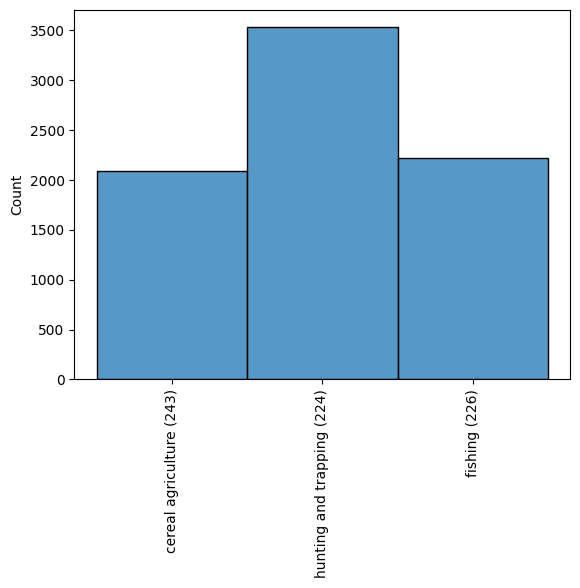

########## None LR 

########## Training LogisticRegression

########## 0.8730057434588385


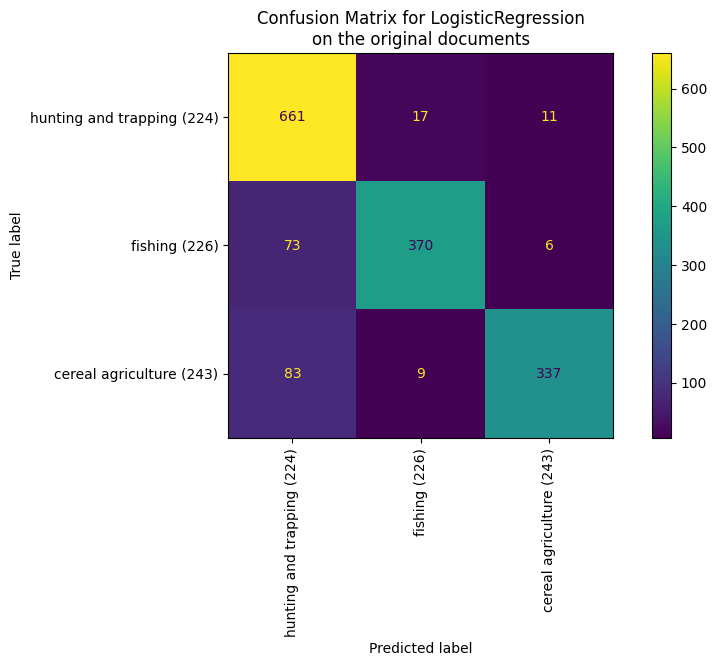

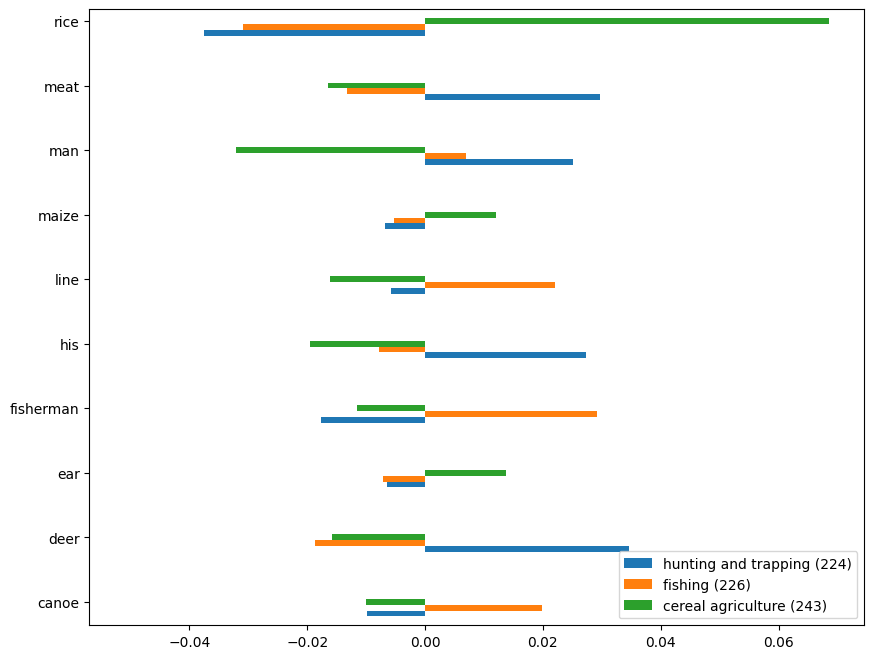

In [6]:
id_to_label['222']
df = run(models=['LR'], chosen_categories=[224, 226, 243], verbose=True, exclude=['fish', 'fishing', 'hunt', 'hunting', 'hunter', 'field', 'crop', 'catch', 'animal', 
                                                                                  'plant', 'corn', 'net', 'hook', 'kill', 'game', 
                                                                                  'harvest', 'grow', 'grain'])

In [29]:
df.groupby('ocms').count() 

KeyError: ('plant', 'corn', 'net', 'hook', 'kill', 'game')

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


########## None RF 

########## Training RandomForestClassifier

########## 0.9243478260869565


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


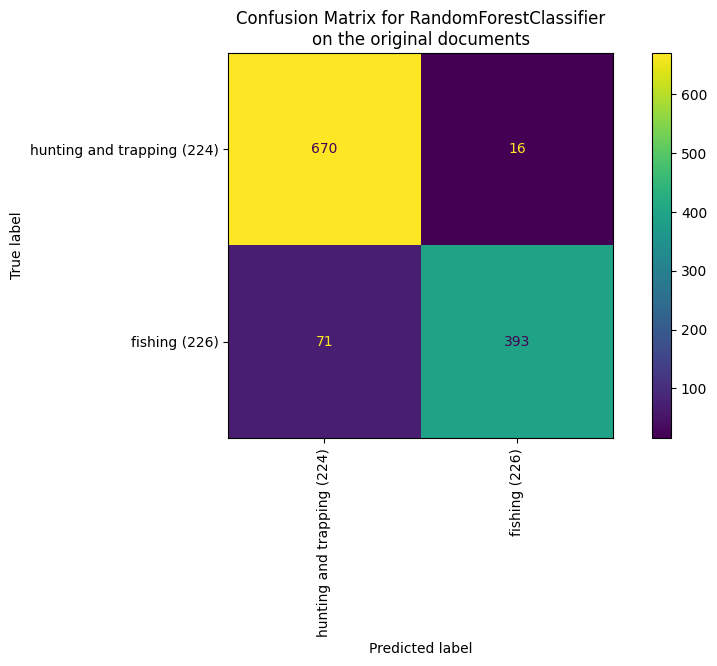

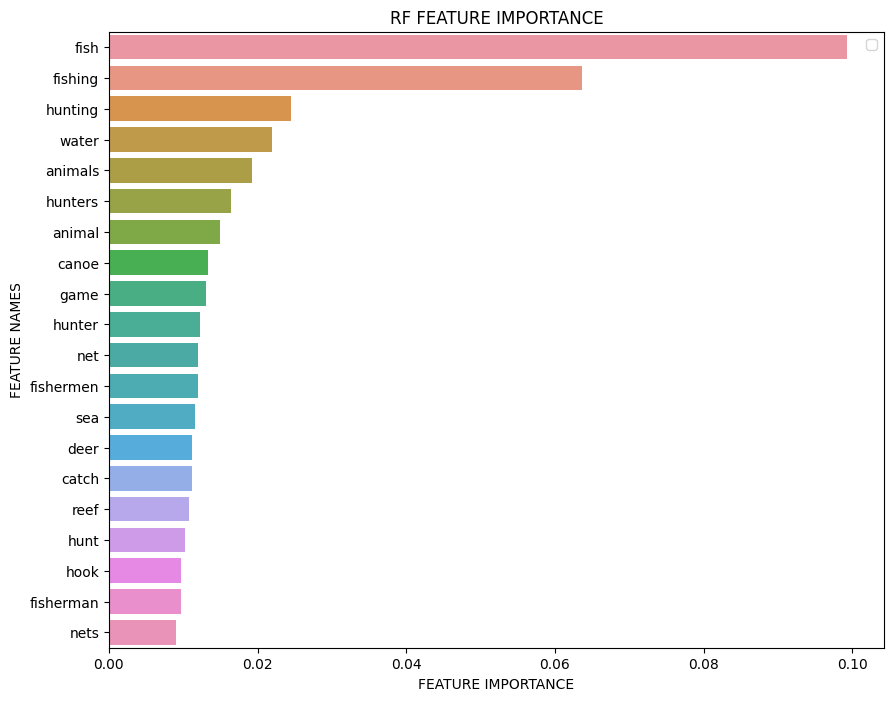

In [8]:
df = run(models=['RF'], chosen_categories=[224, 226])

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


########## None RF 

########## Training RandomForestClassifier

########## 0.9194630872483222


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


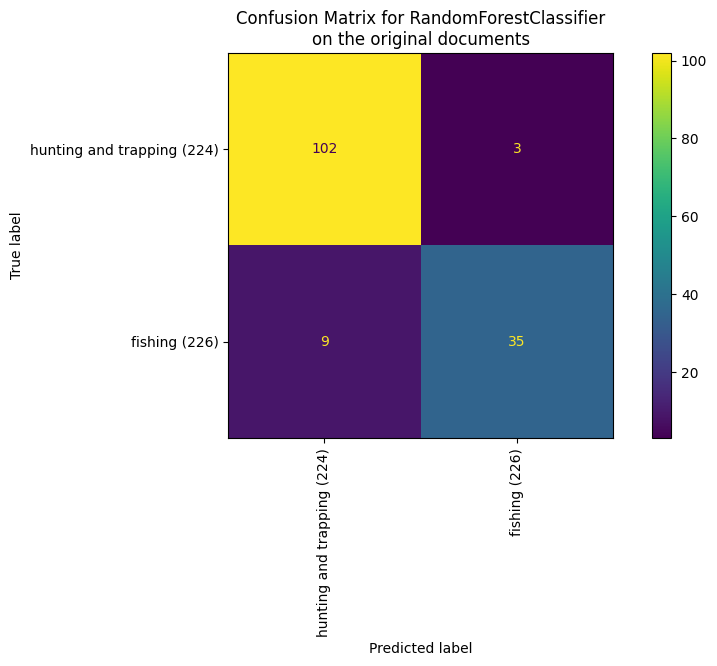

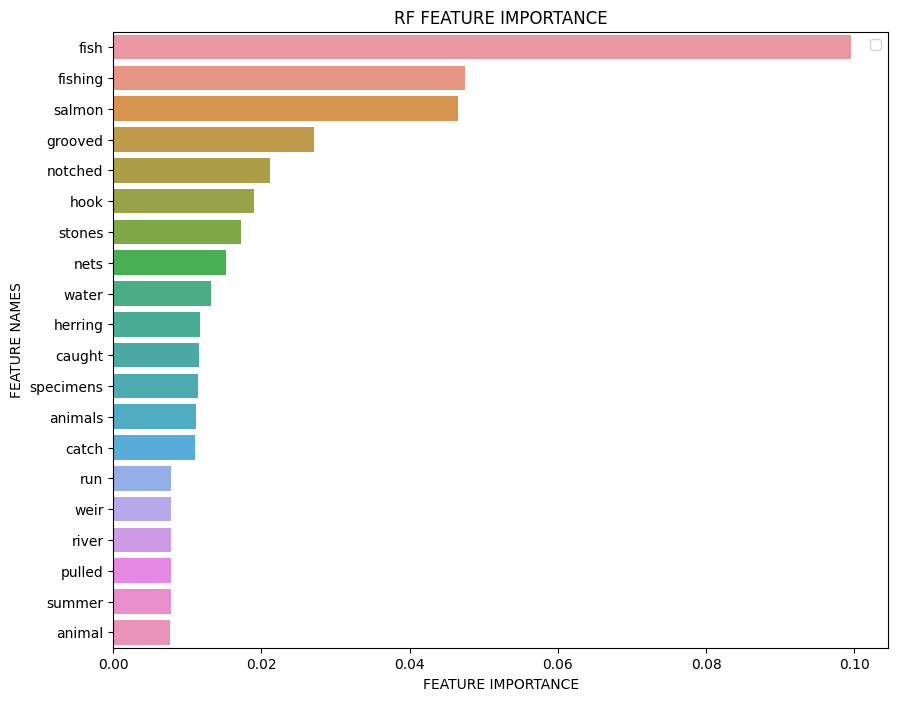

In [8]:
df = run(models=['RF'], chosen_categories=[224, 226])

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## None LR 

########## Training LogisticRegression

########## 0.824455766558592


########## None RF 

########## Training RandomForestClassifier

########## 0.7906438165817508


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


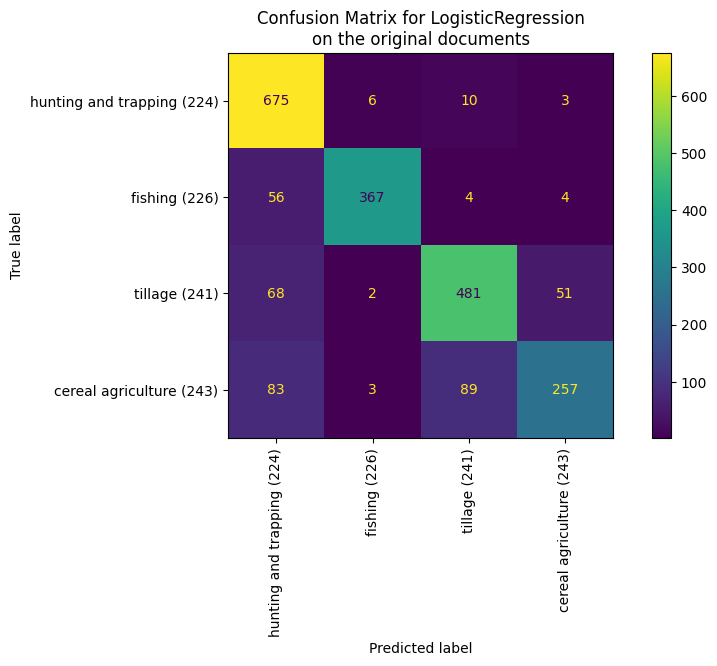

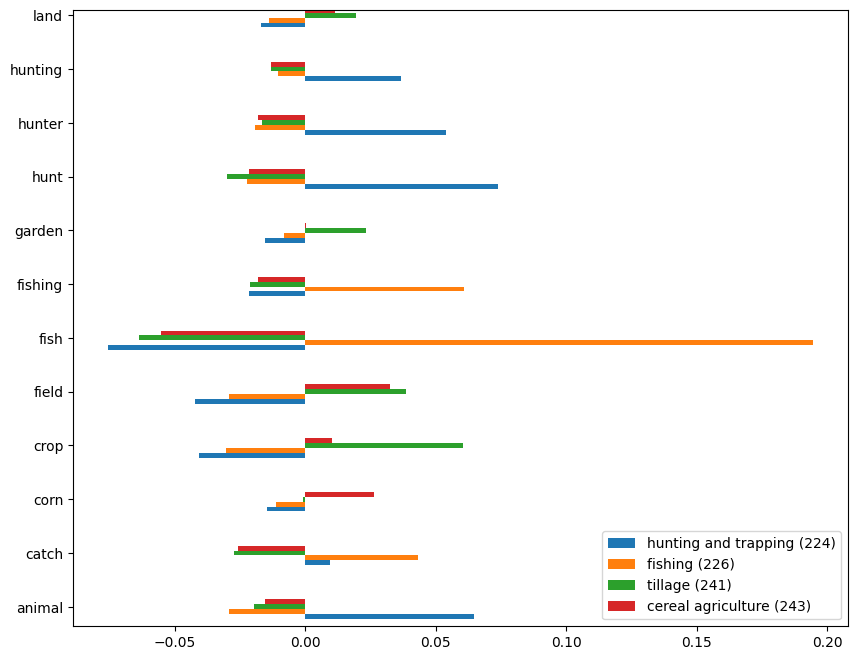

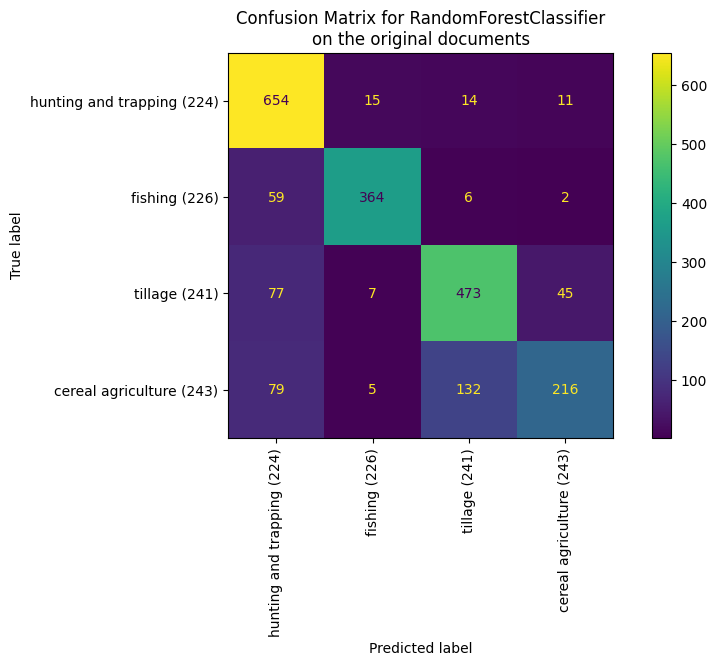

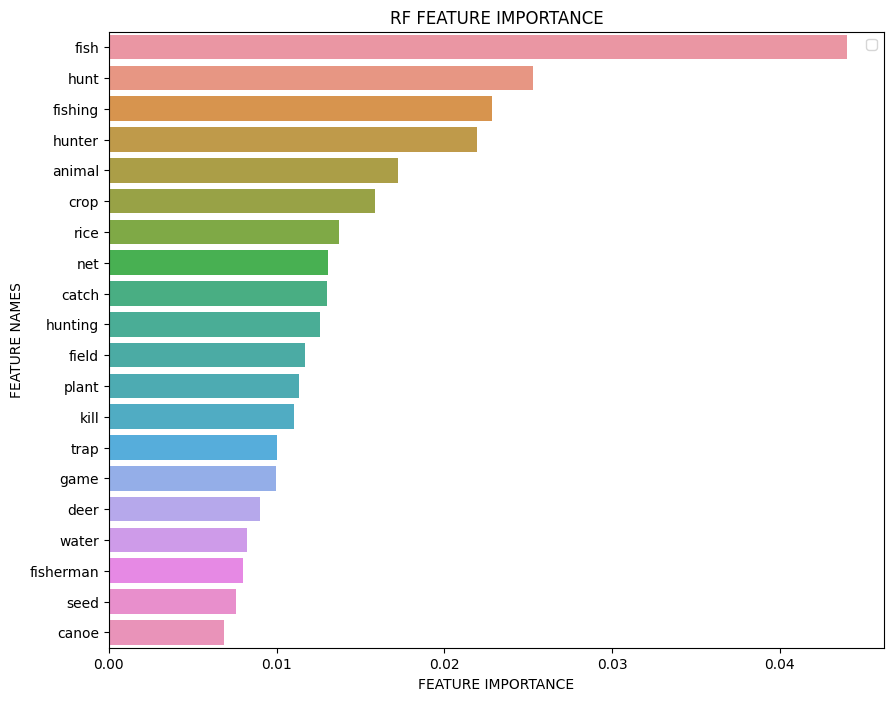

In [14]:
df = run(models=['LR', 'RF'], chosen_categories=[224, 226, 241, 243])

In [16]:
related_to_best = get_related_words(['fish', 'fishing', 'water', 'bait', 'herring', 'food', 'hunter', 'hunt', 'animal'])

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



########## None LR 

########## Training LogisticRegression

########## 0.77674849467346


########## None RF 

########## Training RandomForestClassifier

########## 0.7322834645669292


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


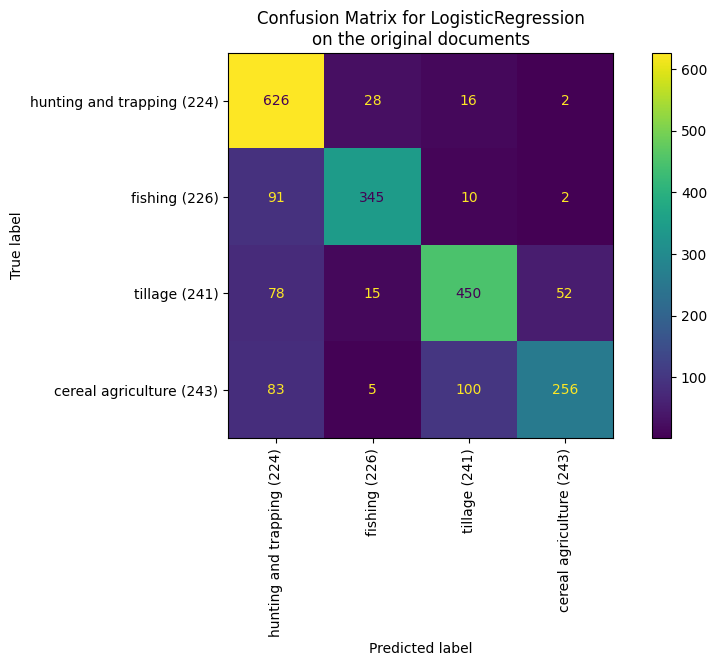

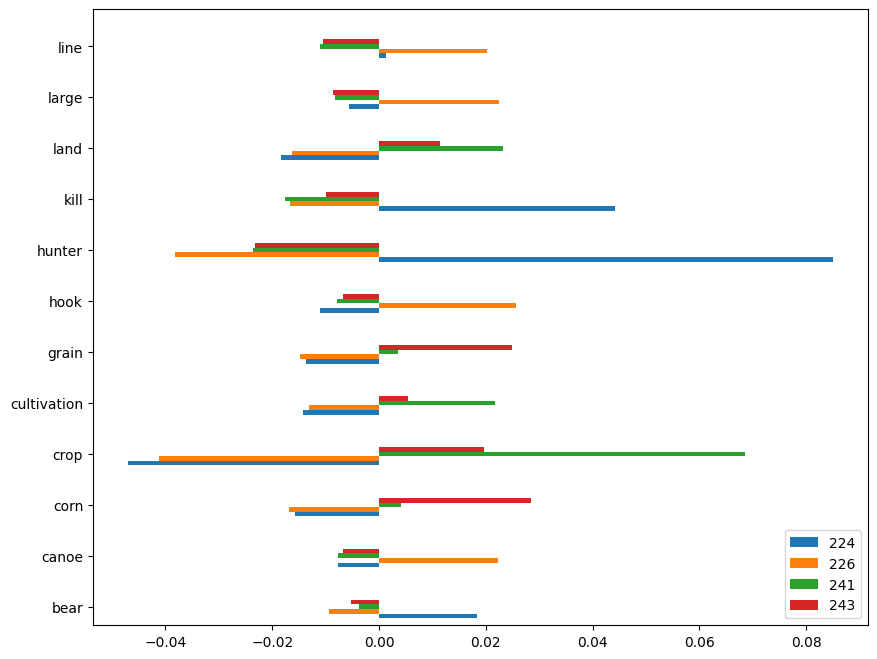

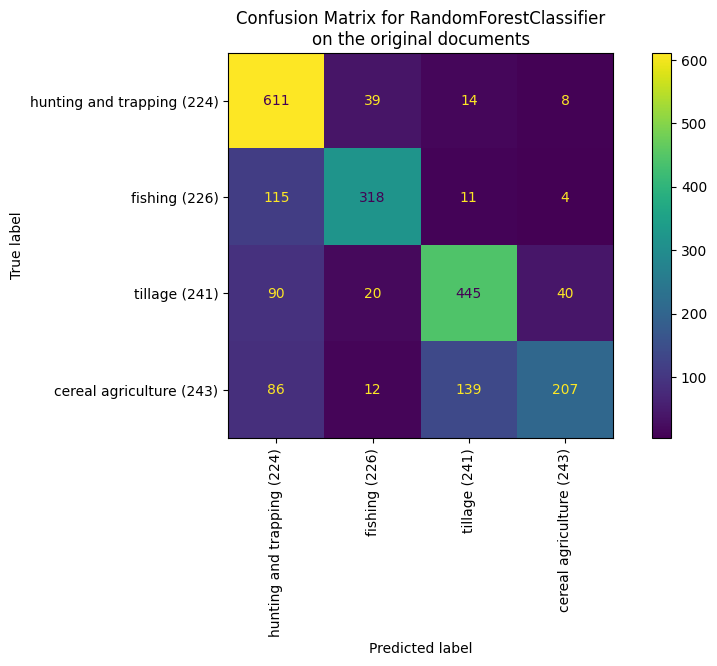

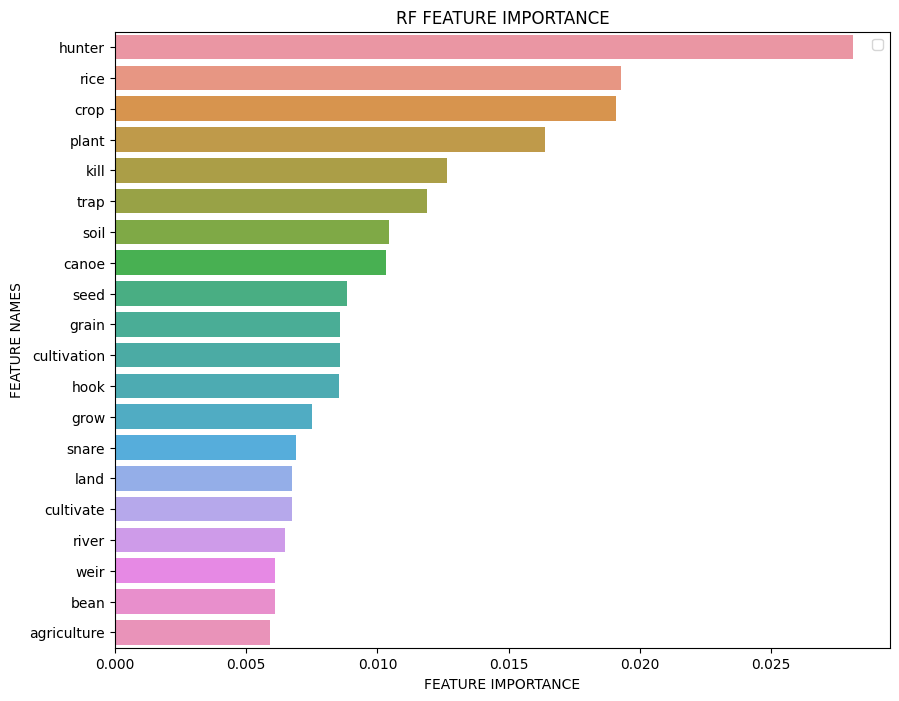

In [11]:
df = run(models=['LR', 'RF'], chosen_categories=[224, 226, 241, 243], exclude=related_to_best)

# Cat vs subcategories (binary classification)

In [87]:
get_related_words(['food'])

{'aliment',
 'alimentary_paste',
 'alimentation',
 'baked_goods',
 'beverage',
 'breakfast_food',
 'butter',
 'cheese',
 'chocolate',
 'chyme',
 'coconut',
 'coconut_meat',
 'cognitive_content',
 'comestible',
 'comfort_food',
 'commissariat',
 'content',
 'convenience_food',
 'culture_medium',
 'dika_bread',
 'drink',
 'drinkable',
 'eatable',
 'edible',
 'fare',
 'feed',
 'fish',
 'food',
 'food_product',
 'foodstuff',
 'fresh_food',
 'fresh_foods',
 'garden_truck',
 'green_goods',
 'green_groceries',
 'health_food',
 'junk_food',
 'leftovers',
 'loaf',
 'manna',
 'manna_from_heaven',
 'meat',
 'medium',
 'mental_object',
 'micronutrient',
 'miraculous_food',
 'nourishment',
 'nutriment',
 'nutrition',
 'pabulum',
 'pasta',
 'potable',
 'produce',
 'provender',
 'provisions',
 'seafood',
 'slop',
 'solid',
 'soul_food',
 'substance',
 'sustenance',
 'viands',
 'victual',
 'victuals',
 'vitellus',
 'water',
 'yoghourt',
 'yoghurt',
 'yogurt',
 'yolk'}

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



239 documents - 0.10MB (training set)
2 categories
vectorize training done in 2.822s at 0.034MB/s
n_samples: 191, n_features: 268
n_samples: 48, n_features: 268


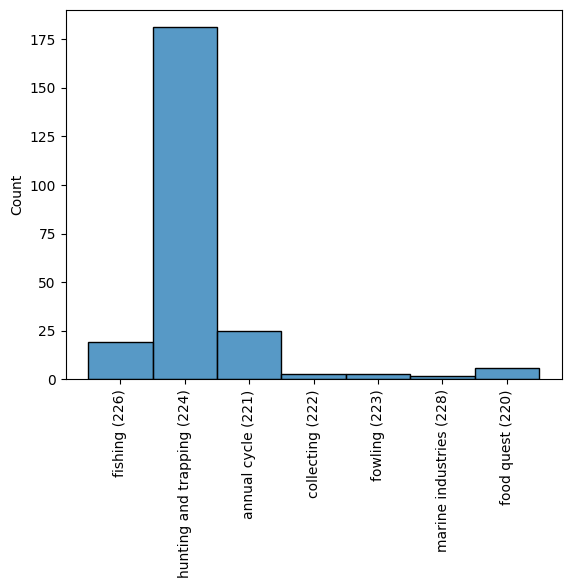

########## None LR 

########## Training LogisticRegression

########## 0.7708333333333334


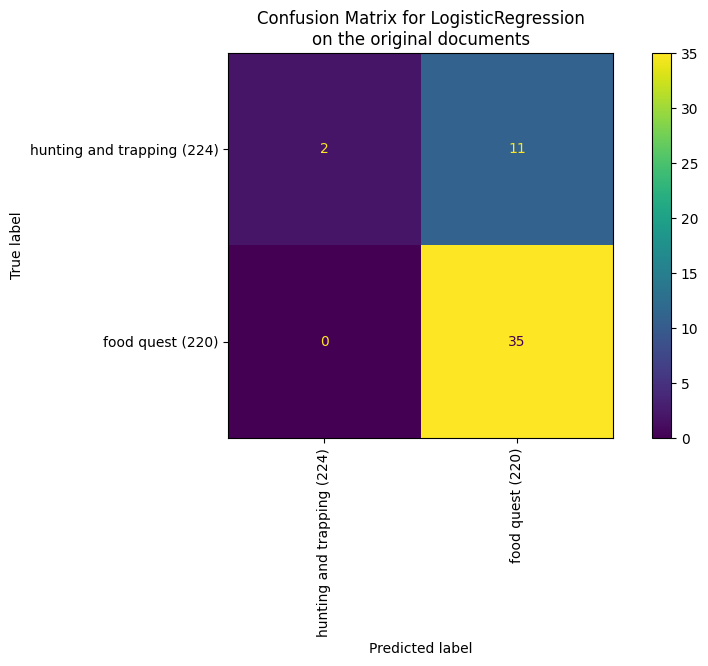

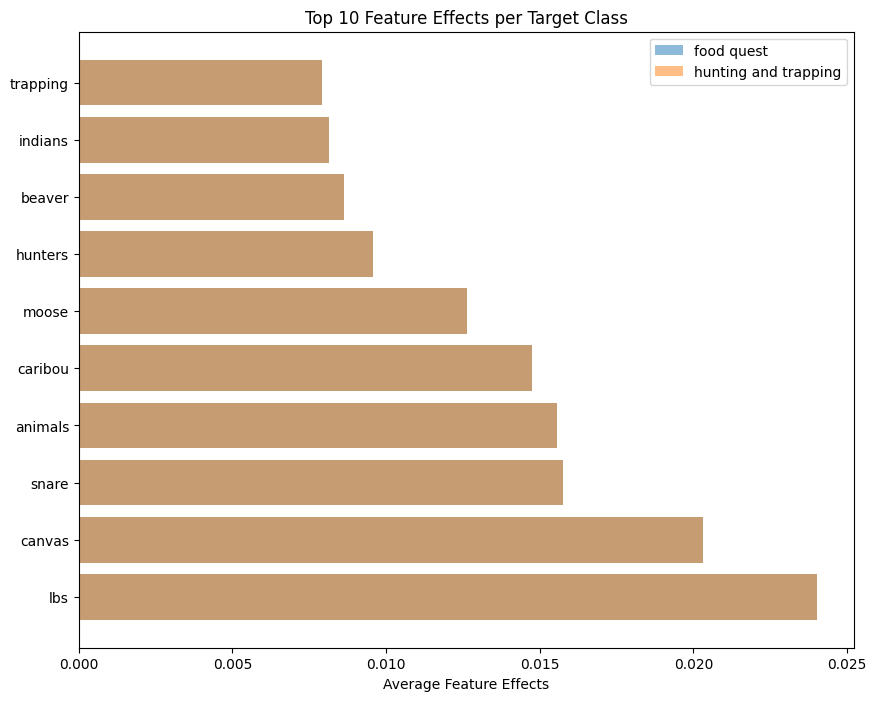

########## None RF 

########## Training RandomForestClassifier

########## 0.7916666666666666


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


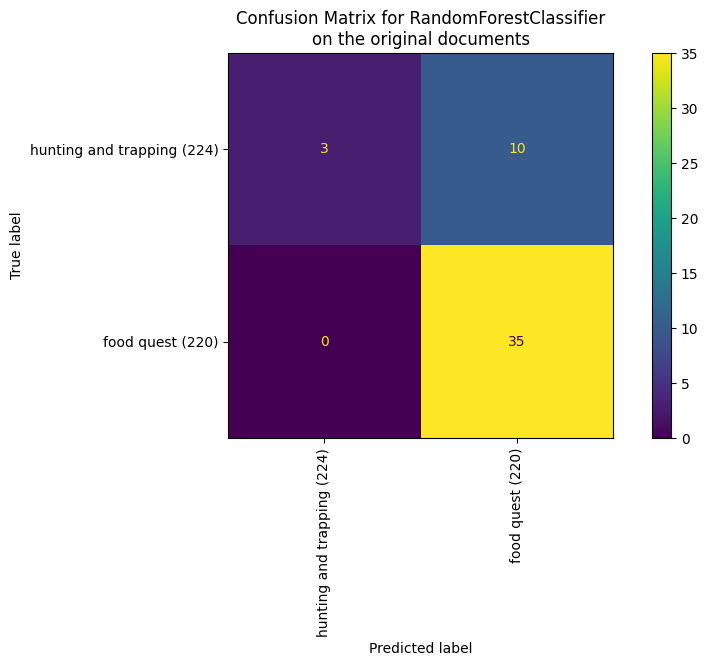

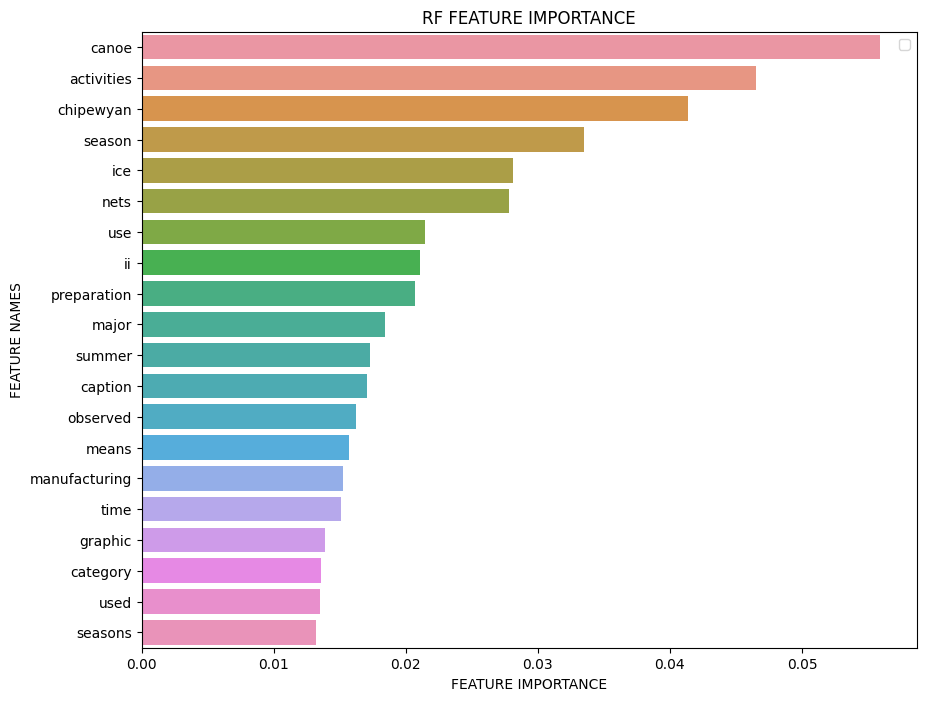

In [95]:
dfs = {}
for i in [ 224]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=True, verbose=True, 
             cultures=['Saami'],#, 'Chipewyans', 'Innu', 'Tlingit', 'Cajuns', 'Pomo', 'Aleut', 'Warao', 'Alutiiq', 'Nuu-chah-nulth'],
             exclude=get_related_words(['fish', 'fishing', 'water', 'bait', 'herring', 'food', 'hunt', 'hunting', 'animal'])
            )
    dfs[i] = df

- look at the category only;
- and the culture is a sanity check for the results i have. Since certain authors write only about one culture!

In [13]:
from nltk.corpus import wordnet 



In [50]:
related_words

['aquatic_vertebrate',
 'bony_fish',
 'bottom-feeder',
 'bottom-dweller',
 'bottom_lurkers',
 'cartilaginous_fish',
 'chondrichthian',
 'climbing_perch',
 'Anabas_testudineus',
 'A._testudineus',
 'fingerling',
 'food_fish',
 'game_fish',
 'sport_fish',
 'mouthbreeder',
 'northern_snakehead',
 'rough_fish',
 'spawner',
 'young_fish',
 'food',
 'solid_food',
 'alewife',
 'anchovy',
 'eel',
 'haddock',
 'hake',
 'mullet',
 'grey_mullet',
 'gray_mullet',
 'panfish',
 'rock_salmon',
 'salmon',
 'schrod',
 'scrod',
 'shad',
 'smelt',
 'stockfish',
 'trout',
 'person',
 'individual',
 'someone',
 'somebody',
 'mortal',
 'soul',
 'search',
 'seek',
 'look_for',
 'catch',
 'grab',
 'take_hold_of',
 'angle',
 'brail',
 'crab',
 'net_fish',
 'prawn',
 'rail',
 'scallop',
 'scollop',
 'seine',
 'shark',
 'shrimp',
 'still-fish',
 'trawl']

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 1.980s at 1.949MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


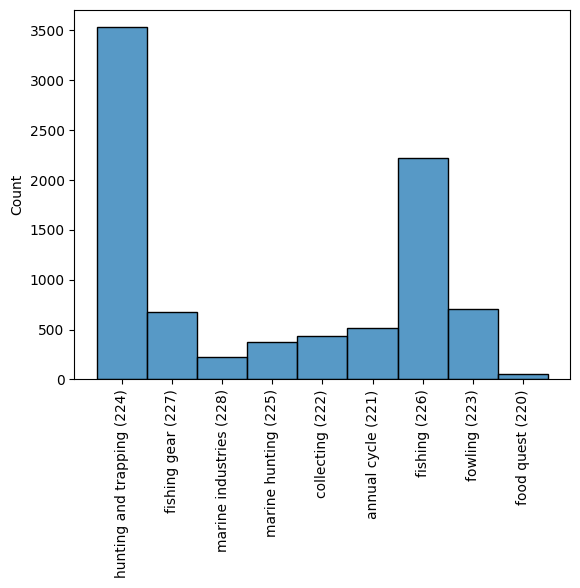

########## None LR 

########## Training LogisticRegression

########## 0.9094036697247706


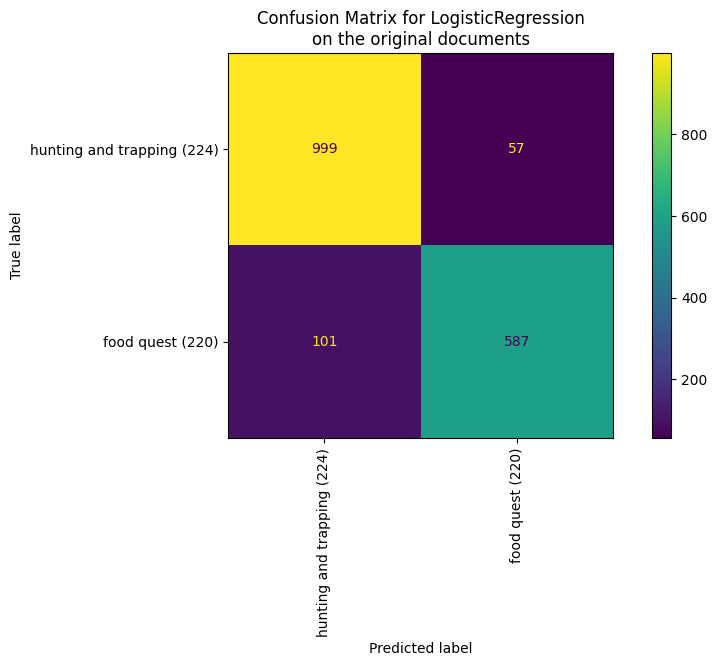

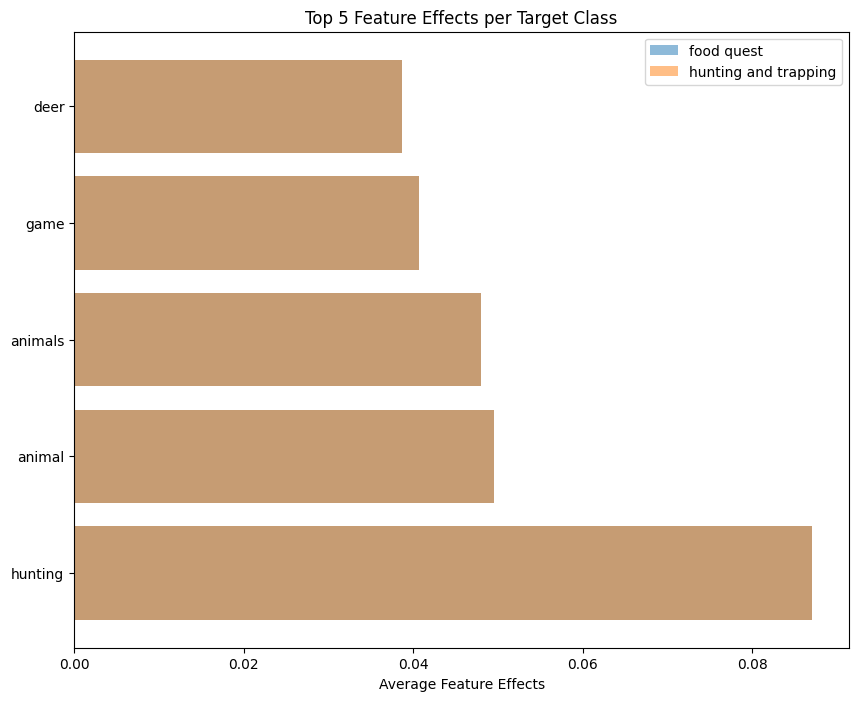

########## None RF 

########## Training RandomForestClassifier

########## 0.8876146788990825


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


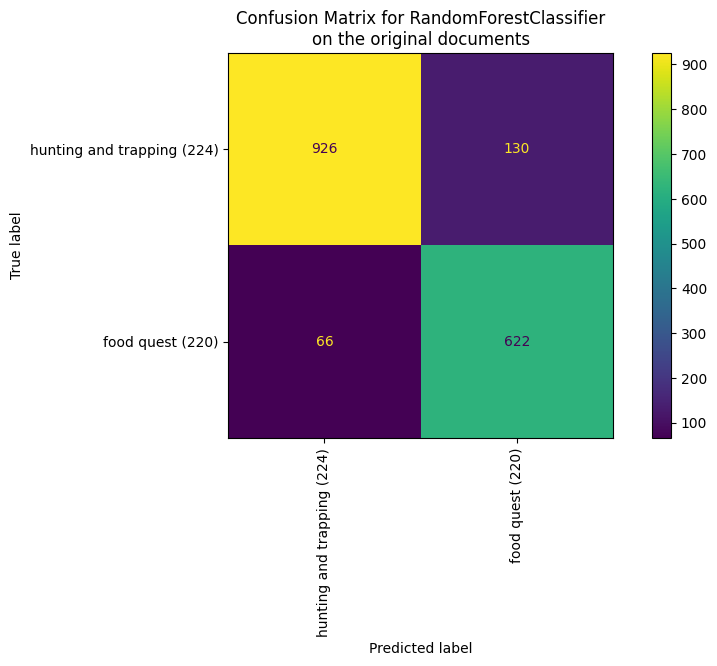

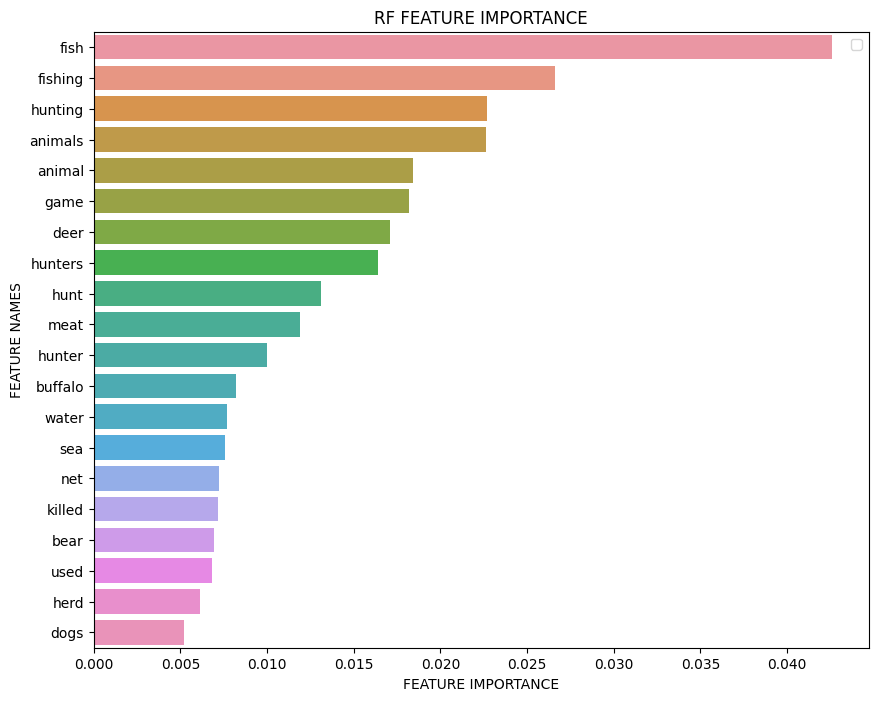

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
2 categories
vectorize training done in 1.988s at 1.941MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


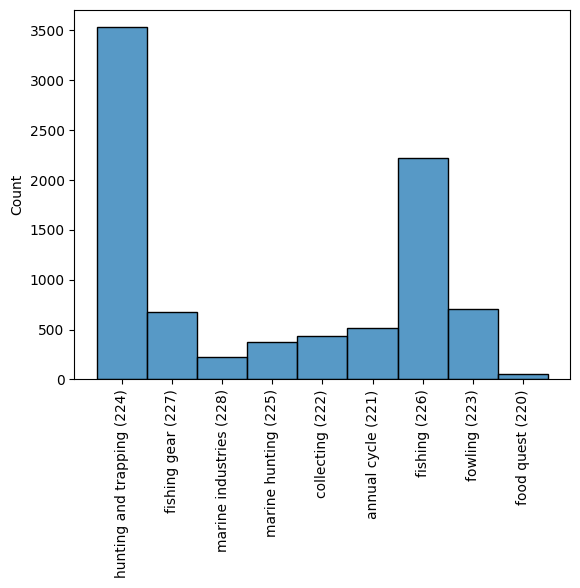

########## None LR 

########## Training LogisticRegression

########## 0.8876146788990825


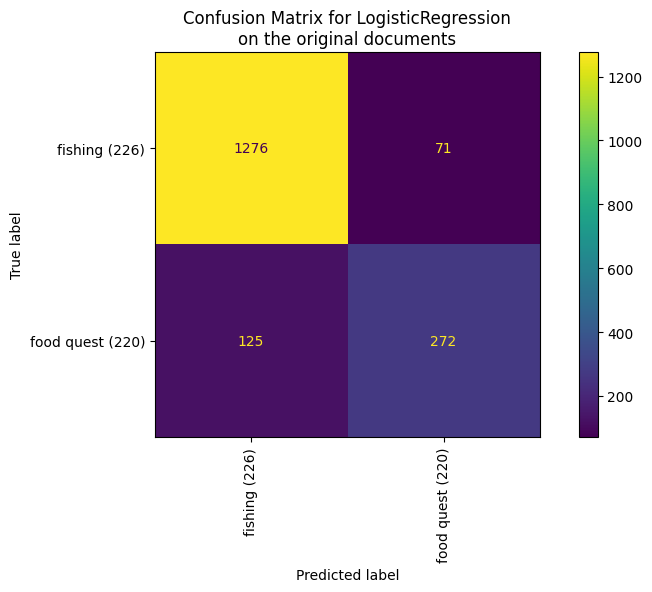

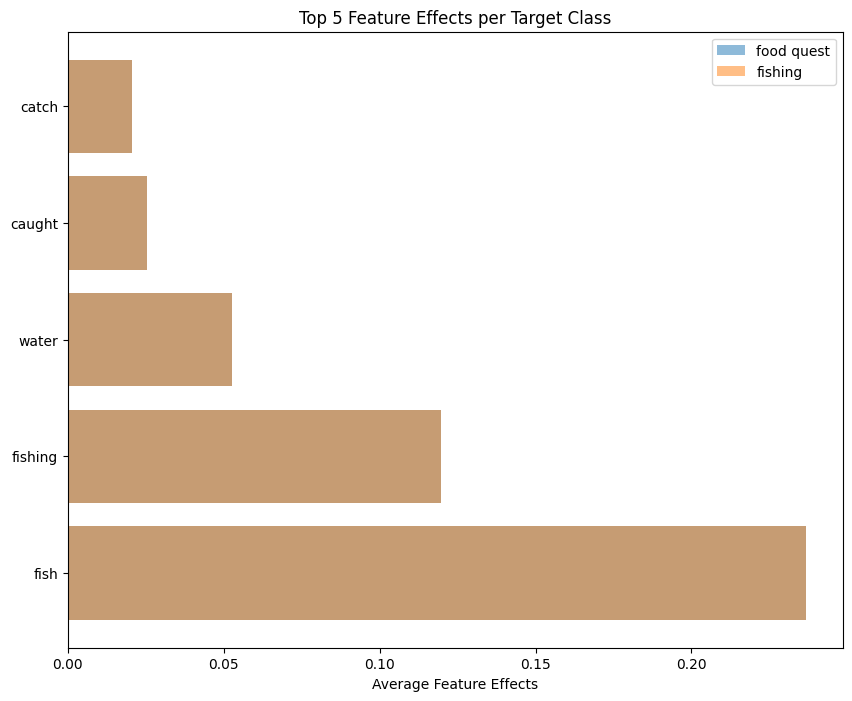

########## None RF 

########## Training RandomForestClassifier

########## 0.9025229357798165


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


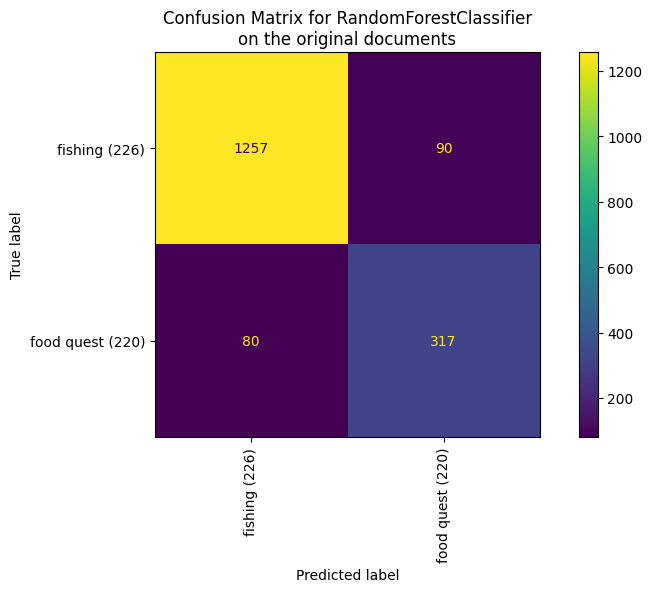

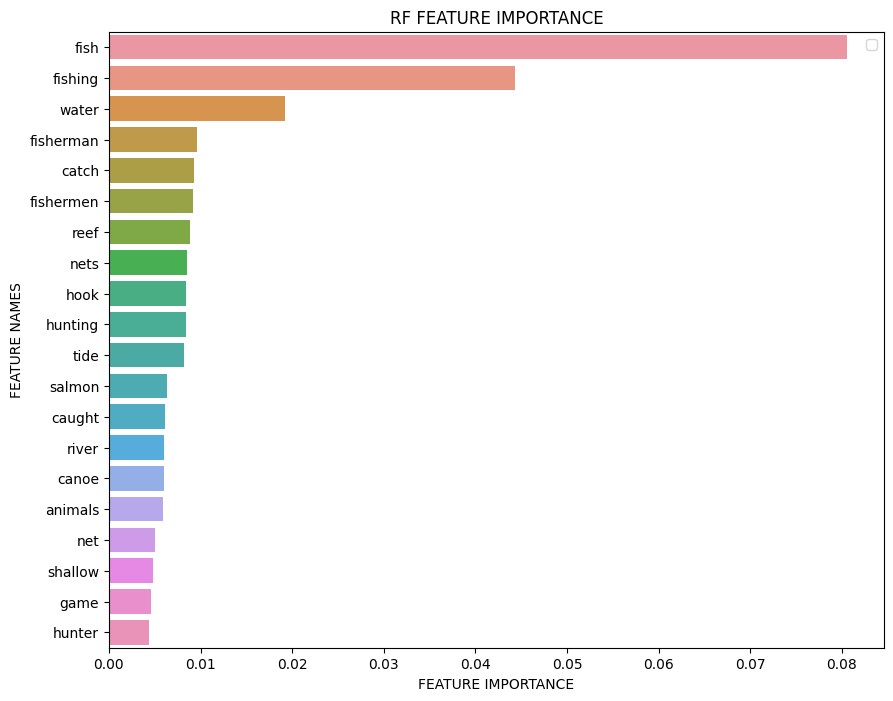

In [11]:
dfs = {}
for i in [224, 226]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=True, verbose=True)
    dfs[i] = df

In [11]:
dfs[224][dfs[224]['predicted_LR'] == 1]

,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,predicted_LR,predicted_RF
89393,99165,nf04-016-007916,nf04-016-007631,nf04-016-007489,nf04-016-002656,The Assiniboines: From the accounts of the Old...,nf04-016,Assiniboine,1961,1939,...,105,nf04-016-007899,nf04-016-007822,nf04-016-007954,"The dogs were tied up out of sight, and all th...",224,en,[224],1,0
162045,177306,oz04-002-020554,oz04-002-019336,NaN,NaN,The Maori: volume 2,oz04-002,Maori,1924,ca.1870-1920,...,479,oz04-002-020519,oz04-002-020478,oz04-002-020578,The ~~puaka~~ trap was really a noosing method...,223,en,[223],1,0
95875,105892,ng06-061-010890-0,ng06-061-010562,ng06-061-010223,ng06-061-009977,The Round Lake Ojibwa,ng06-061,Ojibwa,1962,July 1958-July 1959,...,c37,ng06-061-010873,ng06-061-010821,ng06-061-010896,{{224}} in which beaver may be trapped. Occasi...,224,en,[224],1,0
57325,63407,fo32-012-002576,fo32-012-002497,fo32-012-002281,fo32-012-000096,"Hunting of the Boyela, slash-and-burn agricult...",fo32-012,Mongo,1983,"1976-1977, 1978-1979",...,47,fo32-012-002546,fo32-012-002480,fo32-012-002599,a) Drive: Drive strategy is employed in one of...,224,en,"[128, 224]",1,0
78874,88138,na08-001-021158,na08-001-021070,na08-001-002260,na08-001-002018,Ingalik material culture,na08-001,Ingalik,1970,"1934, 1937",...,240,na08-001-021148,na08-001-021093,na08-001-021227,~~Variations in use~~ . Sometimes a rabbit sna...,224,en,[224],1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164378,179665,rv02-055-000328,rv02-055-000203,rv02-055-000085,NaN,The Dolgans,rv02-055,Yakut,1964,no date,...,659,rv02-055-000306,rv02-055-000273,rv02-055-000376,{{224}} {{177}} Polar-fox hunting was of quit...,224,en,"[177, 224]",1,0
90061,99833,nf06-006-002205,nf06-006-002123,nf06-006-002036,NaN,Modern Blackfeet- Montanans on a reservation,nf06-006,Blackfoot,[1972],1959-1967,...,39,nf06-006-002195,nf06-006-002141,nf06-006-002245,The most common technique for hunting buffalo ...,224,en,"[224, 492]",1,0
21647,22470,ar20-001-006810,ar20-001-006582,ar20-001-002813,ar20-001-002810,The Lakhers,ar20-001,Mara,1932,1924-1928,...,152,ar20-001-006784,ar20-001-006759,ar20-001-006818,[% TRAP FOR RATS AND SQUIRRELS LEIKA [graphi...,224,en,[224],1,1
36278,38916,ep04-017-002697-0,ep04-017-001994,ep04-017-000097,NaN,The Lapps in Finland up to 1945. Vol. 2,ep04-017,Saami,"1984, c1948",1913-1947,...,99,ep04-017-002682,ep04-017-002661,ep04-017-002705,fifteen cm. is fastened to the downward-pointi...,224,en,[224],1,0


In [22]:

df = pd.read_csv('data/en_data.csv', encoding='utf-8')

df['ocms_list'] = df['ocms'].str.split()
df['ocms_list'] = df['ocms_list'].apply(lambda x: [int(i) for i in x])


In [39]:
'241 223'.

0

In [ ]:
np.split()

In [50]:
np.array('241 223'.split())[np.argwhere(np.array('241 223'.split()) == '241')][0][0]

'241'

In [77]:
def filter_other_ocms(df, cat):
    parent_cat = utils.get_parent_category_i(cat)
    
    df['filtered_ocms'] = df['ocms_list'].apply(lambda x: list(filter(lambda i: parent_cat == utils.get_parent_category_i(i), x))[0])

    return df

In [67]:
list(filter(lambda x: 226 == x, [136, 226, 228]))

[226]

In [59]:
df['test'] = df['ocms'].apply(lambda x: np.any([i == '241' for i in x.split()])
                 and 
                 np.array(x.split())[np.argwhere(np.array(x.split()) == '241')][0][0])

In [75]:
df[ df['ocms_list'].map(lambda x: (224 not in x and len([cat for cat in x if utils.get_parent_category_i(cat) == utils.get_parent_category_i(224)]) == 1 )) ]

,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,pub.lang,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,test
11,11,aa01-001-005037,aa01-001-004389,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,167,aa01-001-005015,aa01-001-004985,aa01-001-005061,{{175}} {{656}} {{316}} {{228}} “Mining con...,175 228 316 656,en,"[175, 228, 316, 656]",False
12,12,aa01-001-006589,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,219,aa01-001-006579,aa01-001-006532,aa01-001-006599,{{175}} {{425}} {{226}} “As the year advance...,175 226 425,en,"[175, 226, 425]",False
13,13,aa01-001-006882,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,230,aa01-001-006872,aa01-001-006845,aa01-001-006890,{{651}} {{226}} “Korean fisheries annually re...,226 651,en,"[226, 651]",False
18,18,aa01-001-007956,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,270,aa01-001-007926,aa01-001-007909,aa01-001-007971,{{222}} {{276}} “A wild variety of this plant...,222 276,en,"[222, 276]",False
20,20,aa01-001-007981,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,English,270-271,aa01-001-007971,aa01-001-007926,aa01-001-007990,{{226}} {{262}} “Another great Korean industr...,226 262,en,"[226, 262]",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183188,199727,sv03-011-006185,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,103,sv03-011-006123,sv03-011-006065,sv03-011-006192,{{222 262}} Plant picking is not of much impor...,222 262,en,"[222, 262]",False
183189,199728,sv03-011-006202,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,104,sv03-011-006192,sv03-011-006123,sv03-011-006278,"{{222 262}} A few wild plants, however, become...",222 262,en,"[222, 262]",False
183206,199745,sv03-011-008485,sv03-011-008472,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,139,sv03-011-008473,sv03-011-008399,sv03-011-008545,"{{226 262}} Despite the proximity of the sea, ...",226 262,en,"[226, 262]",False
183207,199746,sv03-011-008622,sv03-011-008585,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,English,141,sv03-011-008605,sv03-011-008545,sv03-011-008675,{{262 226}} Mention has already been made of t...,226 262,en,"[226, 262]",False


In [78]:
filter_other_ocms(df[ df['ocms_list'].map(lambda x: (224 not in x and len([cat for cat in x if utils.get_parent_category_i(cat) == utils.get_parent_category_i(224)]) == 1 )) ], 226)

C:\Users\alhas\AppData\Local\Temp\ipykernel_11560\2002507869.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,test,filtered_ocms
11,11,aa01-001-005037,aa01-001-004389,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,167,aa01-001-005015,aa01-001-004985,aa01-001-005061,{{175}} {{656}} {{316}} {{228}} “Mining con...,175 228 316 656,en,"[175, 228, 316, 656]",False,228
12,12,aa01-001-006589,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,219,aa01-001-006579,aa01-001-006532,aa01-001-006599,{{175}} {{425}} {{226}} “As the year advance...,175 226 425,en,"[175, 226, 425]",False,226
13,13,aa01-001-006882,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,230,aa01-001-006872,aa01-001-006845,aa01-001-006890,{{651}} {{226}} “Korean fisheries annually re...,226 651,en,"[226, 651]",False,226
18,18,aa01-001-007956,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,270,aa01-001-007926,aa01-001-007909,aa01-001-007971,{{222}} {{276}} “A wild variety of this plant...,222 276,en,"[222, 276]",False,222
20,20,aa01-001-007981,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,270-271,aa01-001-007971,aa01-001-007926,aa01-001-007990,{{226}} {{262}} “Another great Korean industr...,226 262,en,"[226, 262]",False,226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183188,199727,sv03-011-006185,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,103,sv03-011-006123,sv03-011-006065,sv03-011-006192,{{222 262}} Plant picking is not of much impor...,222 262,en,"[222, 262]",False,222
183189,199728,sv03-011-006202,sv03-011-006182,sv03-011-006140,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,104,sv03-011-006192,sv03-011-006123,sv03-011-006278,"{{222 262}} A few wild plants, however, become...",222 262,en,"[222, 262]",False,222
183206,199745,sv03-011-008485,sv03-011-008472,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,139,sv03-011-008473,sv03-011-008399,sv03-011-008545,"{{226 262}} Despite the proximity of the sea, ...",226 262,en,"[226, 262]",False,226
183207,199746,sv03-011-008622,sv03-011-008585,sv03-011-008084,NaN,"Making a living in the Marbial Valley, Haiti",sv03-011,Haitians,1951,no date,...,141,sv03-011-008605,sv03-011-008545,sv03-011-008675,{{262 226}} Mention has already been made of t...,226 262,en,"[226, 262]",False,226


In [85]:
filter_other_ocms(df[ df['ocms_list'].map(lambda x: (224 in x and 
                                                     not np.any([224 != cat and utils.get_parent_category_i(cat) == utils.get_parent_category_i(224) for cat in x]) )
                                         )], 224)

C:\Users\alhas\AppData\Local\Temp\ipykernel_11560\2002507869.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,sreid,section,sectpar,sectgpar,title,hdoc,culture,pub.date,field.date,...,page,pageEid,prevPage,nextPage,textrecord,ocms,language,ocms_list,test,filtered_ocms
6,6,aa01-001-000606,aa01-001-000028,NaN,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,21-22,aa01-001-000596,aa01-001-000580,aa01-001-000616,{{136}} {{224}} {{476}} “So much for domesti...,136 224 476,en,"[136, 224, 476]",False,224
7,7,aa01-001-000636,aa01-001-000028,NaN,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,22,aa01-001-000616,aa01-001-000596,aa01-001-000648,{{136}} {{224}} {{278}} {{237}} “Deer are c...,136 224 237 278,en,"[136, 224, 237, 278]",False,224
8,8,aa01-001-000706,aa01-001-000028,NaN,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,23-24,aa01-001-000696,aa01-001-000666,aa01-001-000714,"{{136}} {{224}} “For its bird life, especiall...",136 224,en,"[136, 224]",False,224
14,14,aa01-001-006900,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,230-231,aa01-001-006890,aa01-001-006872,aa01-001-006909,{{655}} {{224}} “Furs have always been an imp...,224 655,en,"[224, 655]",False,224
21,21,aa01-001-008162,aa01-001-006496,aa01-001-000028,NaN,The passing of Korea,aa01-001,Korea,NaN,1890-1905,...,275,aa01-001-008145,aa01-001-008126,aa01-001-008169,{{224}} “The primitive occupations of hunting ...,224,en,[224],False,224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181141,197628,st13-013-008935,st13-013-008917,st13-013-000729,st13-013-000079,The ethnobotany of the Island Caribs of Dominica,st13-013,Island Carib,1957,1930-1956,...,602,st13-013-008876,st13-013-008766,st13-013-009006,Caribs crush the bark of bois tan ( ~~Byrsonim...,224 824,en,"[224, 824]",False,224
181844,198337,su01-001-035257,su01-001-034961,su01-001-034175,su01-001-030711,The people of Puerto Rico: a study in social a...,su01-001,Puerto Ricans (Island),1956,1948-1949,...,[p. 363-A],su01-001-035219,su01-001-035150,su01-001-035264,{{224}} A third supplementary economic activit...,224 857,en,"[224, 857]",False,224
181845,198338,su01-001-035257-0,su01-001-034961,su01-001-034175,su01-001-030711,The people of Puerto Rico: a study in social a...,su01-001,Puerto Ricans (Island),1956,1948-1949,...,[p. 363-A],su01-001-035219,su01-001-035150,su01-001-035264,{{224}} food and of reducing damage to the can...,224 857,en,"[224, 857]",False,224
181846,198339,su01-001-035277,su01-001-034961,su01-001-034175,su01-001-030711,The people of Puerto Rico: a study in social a...,su01-001,Puerto Ricans (Island),1956,1948-1949,...,[p. 363-B],su01-001-035264,su01-001-035219,su01-001-035311,{{262 231 438}} Crabs are usually not eaten as...,224 231 262 438 577 685 857,en,"[224, 231, 262, 438, 577, 685, 857]",False,224


In [60]:
df['test']

0           241
1         False
2         False
3         False
4         False
          ...  
183215      241
183216      241
183217    False
183218      241
183219    False
Name: test, Length: 183220, dtype: object

In [15]:
dfs[224]['ocms'].str.split

152067    [226]
155721    [226]
159205    [226]
158461    [225]
86251     [223]
          ...  
95797     [226]
92007     [221]
68565     [223]
172653    [221]
76449     [226]
Name: ocms, Length: 1744, dtype: object

# Cat vs subcategories (multi-label classification)

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 1.871s at 2.063MB/s
n_samples: 6973, n_features: 6588
n_samples: 1744, n_features: 6588


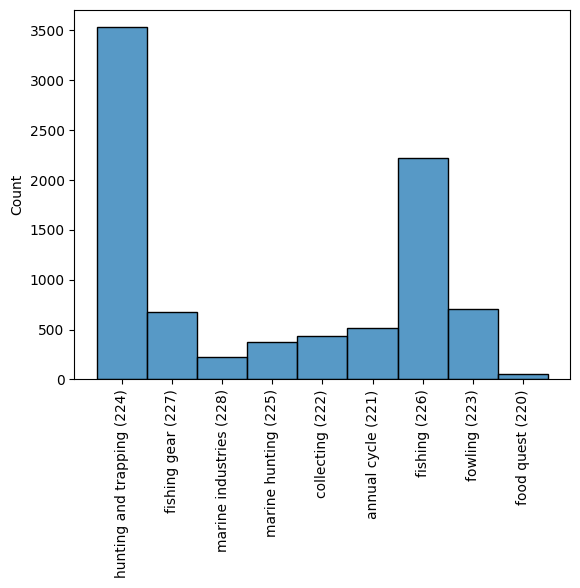

########## None LR 

########## Training LogisticRegression

########## 0.7568807339449541


6588 [[-0.04149707  0.09760917 -0.00680812 ... -0.0034448  -0.01100974
  -0.01492088]
 [-0.17576595 -0.27620896  0.01878018 ... -0.0189395  -0.07123426
   0.4489107 ]
 [-0.04895008  0.10312413 -0.03545108 ... -0.01752379  0.57886867
  -0.06188645]
 ...
 [-0.30805714 -0.04576085 -0.09537761 ... -0.17682852 -0.14354767
   0.08550778]
 [ 0.50284053 -0.08420313 -0.00703685 ... -0.02244814 -0.06030139
  -0.07634123]
 [ 0.29879094  0.35956597 -0.02139299 ... -0.01163683 -0.0312702
  -0.06526408]] ['224' '227' '228' '225' '222' '221' '226' '223' '220'] ['10' '100' '11' ... 'zebra' 'zingg' 'zone']
top 5 keywords per class:
       224     227       228     225      222      221      226   223      220
0     fish  winter      wild   birds  hunting      sea     fish  fish  fishing
1  hunting  season      tree    bird   animal     seal  fishing  used     fish
2   winter    time     fruit     net  animals   animal    water   net     nets
3     line  summer     women  caught     deer  animals   caug

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


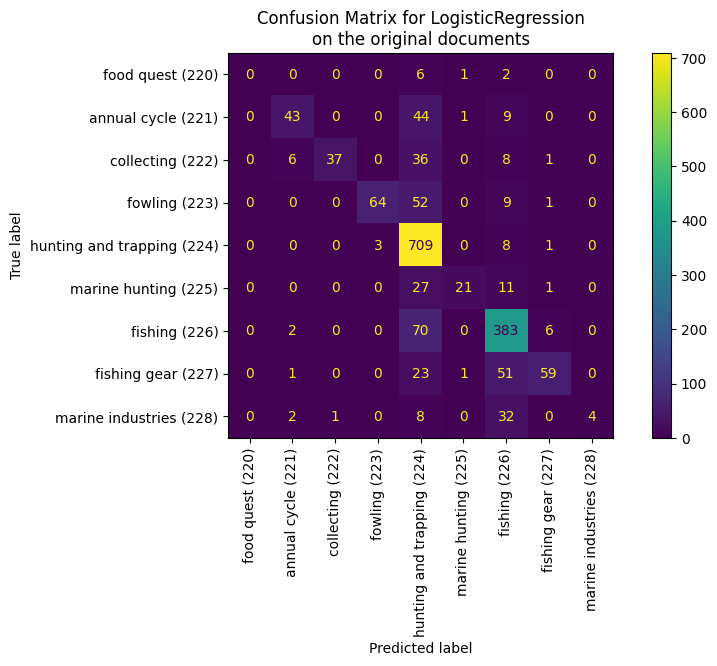

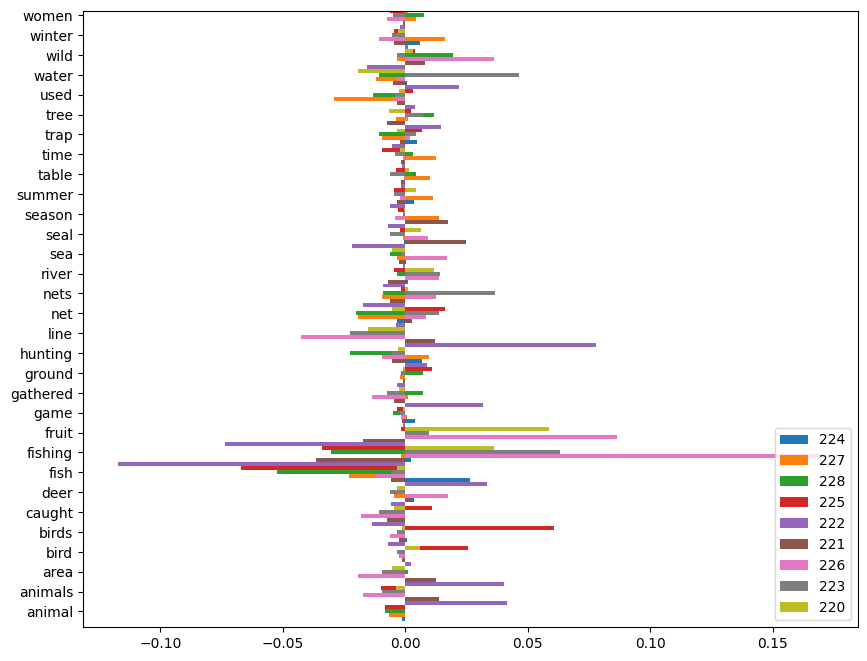

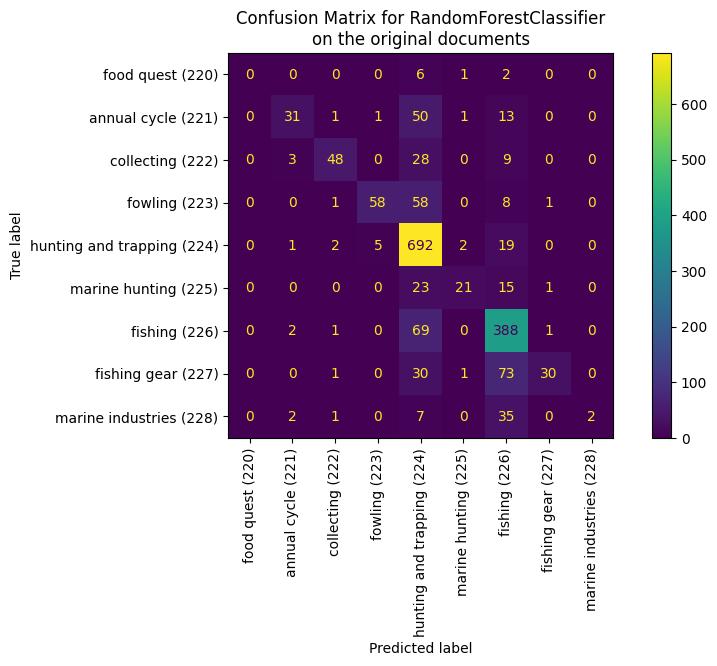

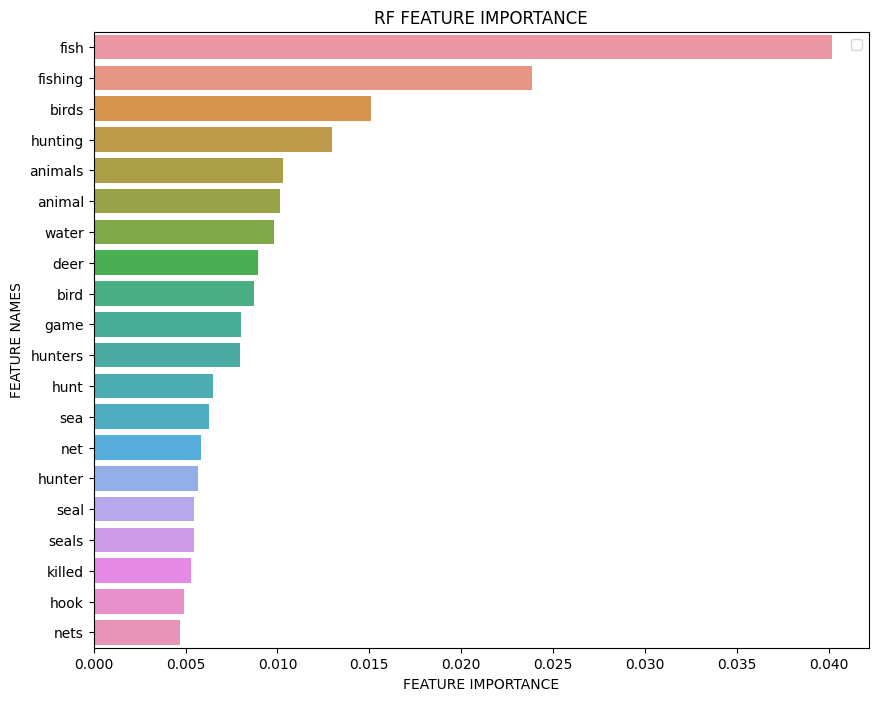

C:\Users\alhas\anaconda3\envs\thesis\Lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 1.684s at 2.125MB/s
n_samples: 6546, n_features: 6097
n_samples: 1637, n_features: 6097


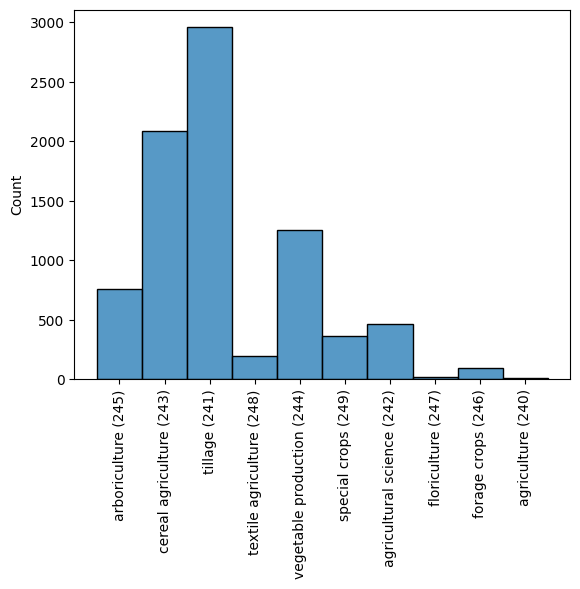

########## None LR 

########## Training LogisticRegression

########## 0.6023213194868662


ValueError: The number of FixedLocator locations (8), usually from a call to set_ticks, does not match the number of labels (10).

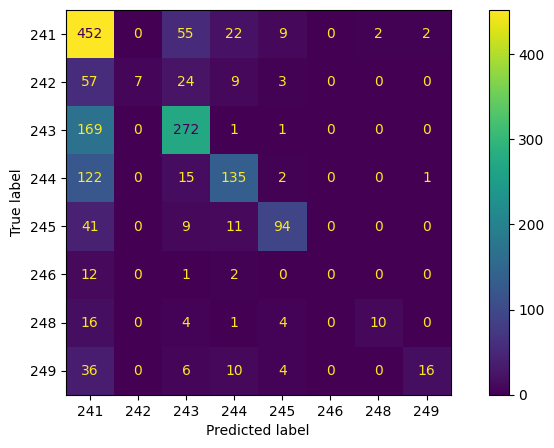

In [82]:

dfs = {}
for i in [220, 240]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=False, verbose=True)
    dfs[i] = df

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 2.097s at 1.840MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


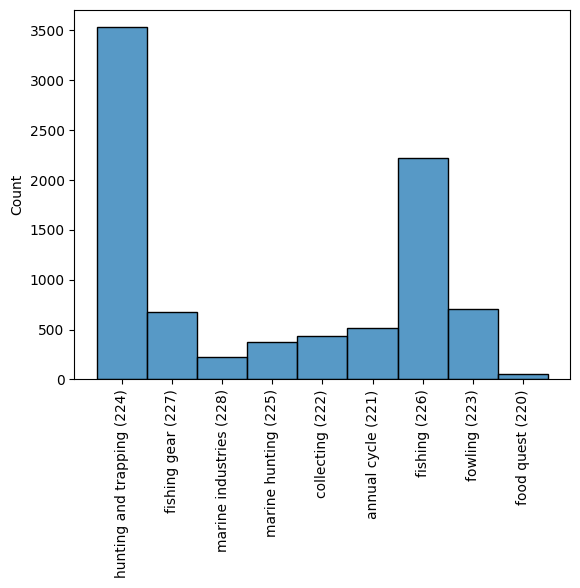

########## None LR 

########## Training LogisticRegression

########## 0.7597477064220184


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



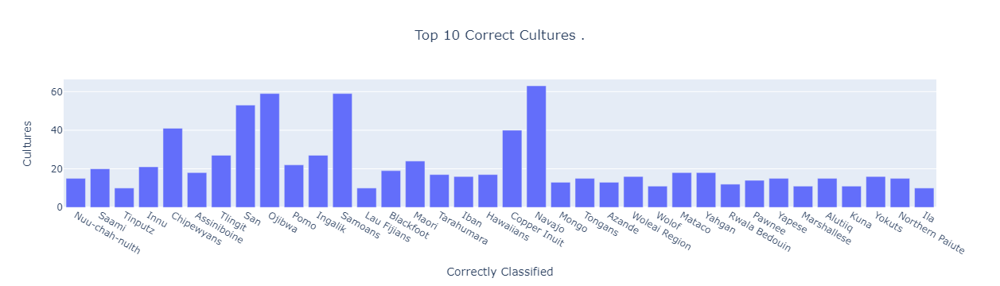

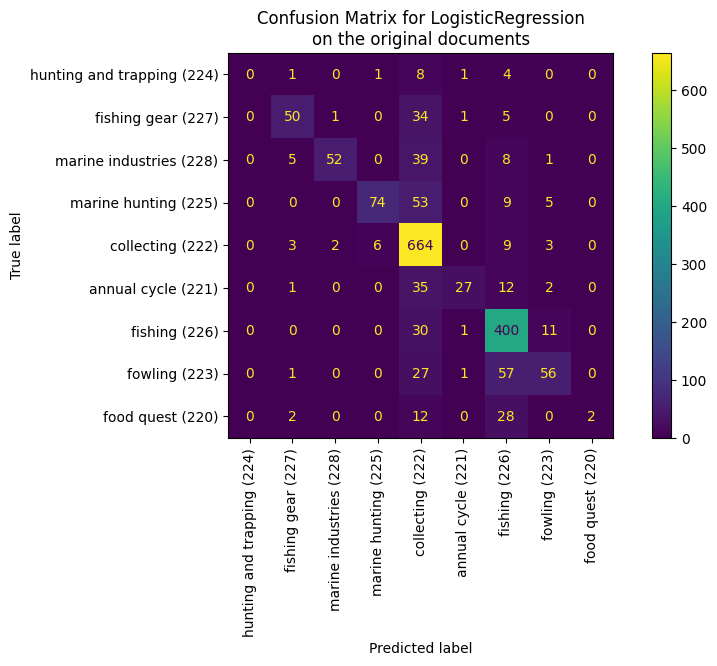

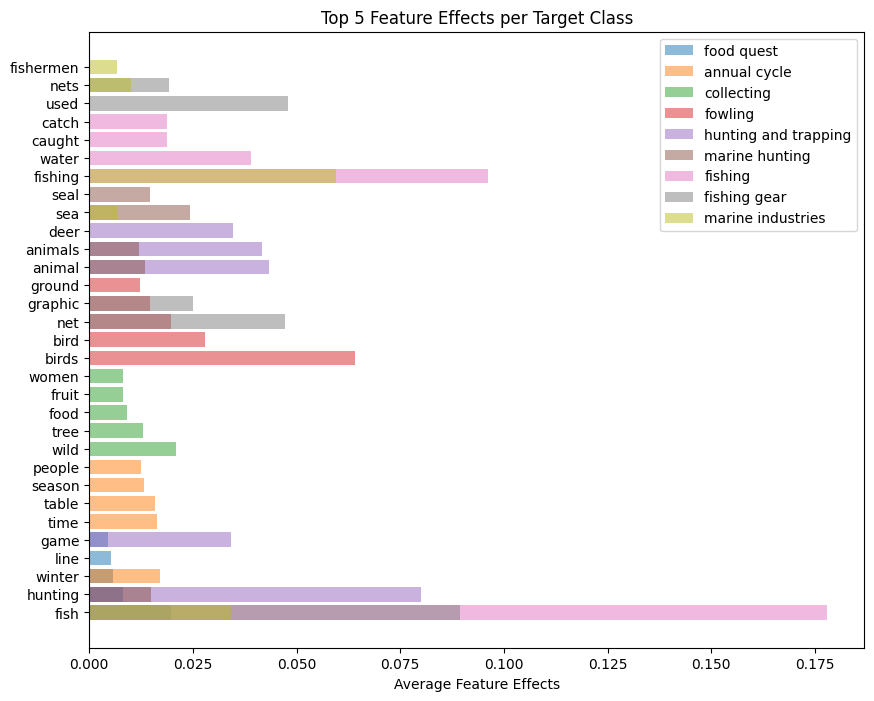

########## None RF 

########## Training RandomForestClassifier

########## 0.7339449541284404


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



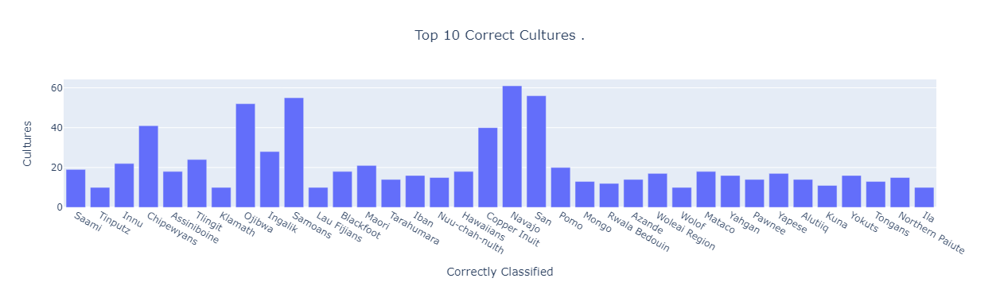

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


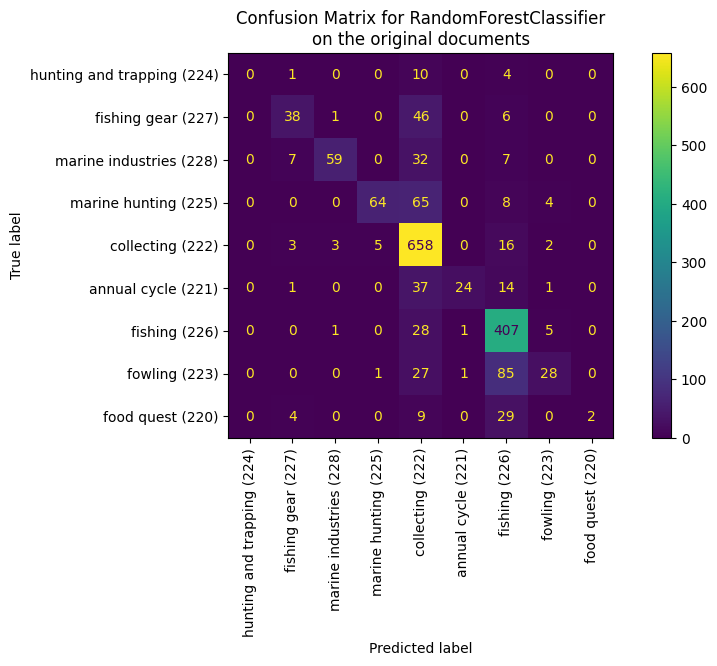

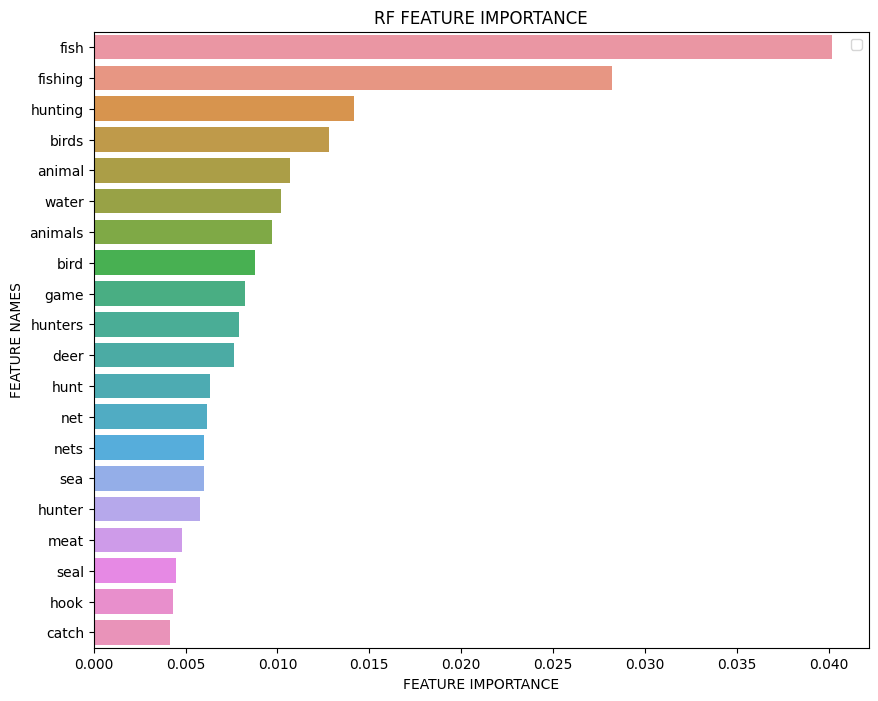

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8717 documents - 3.86MB (training set)
9 categories
vectorize training done in 2.251s at 1.714MB/s
n_samples: 6973, n_features: 6825
n_samples: 1744, n_features: 6825


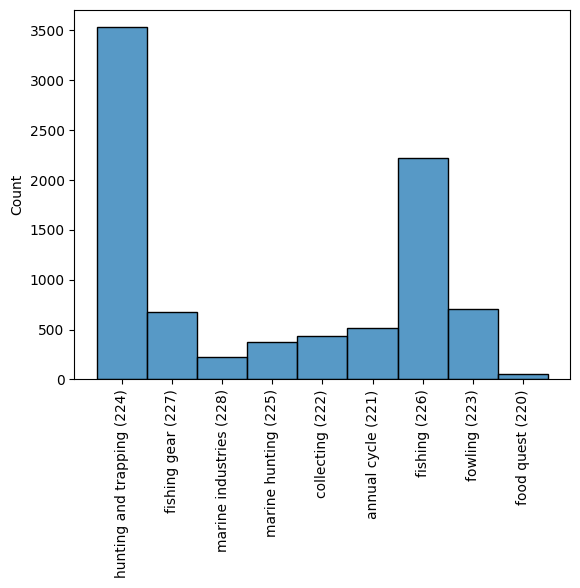

########## None LR 

########## Training LogisticRegression

########## 0.7746559633027523


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



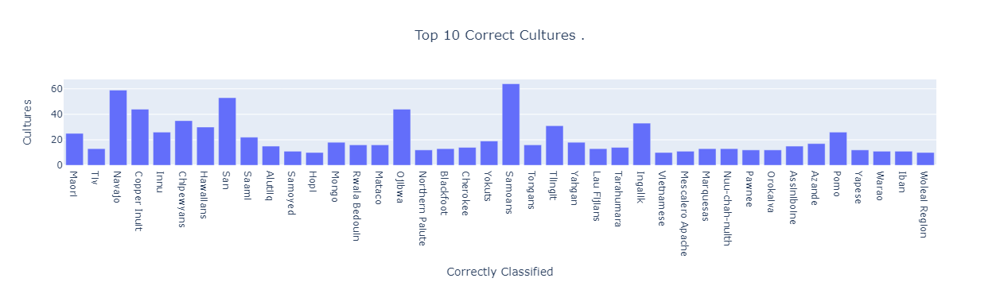

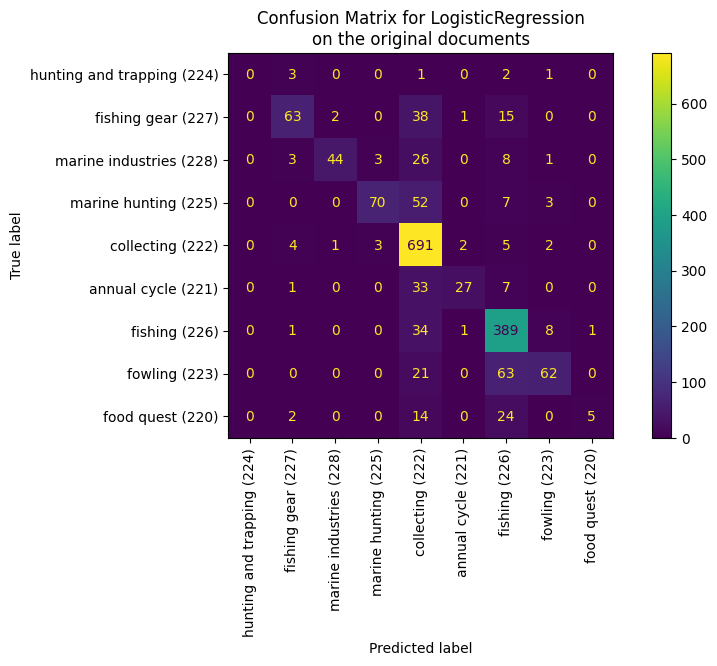

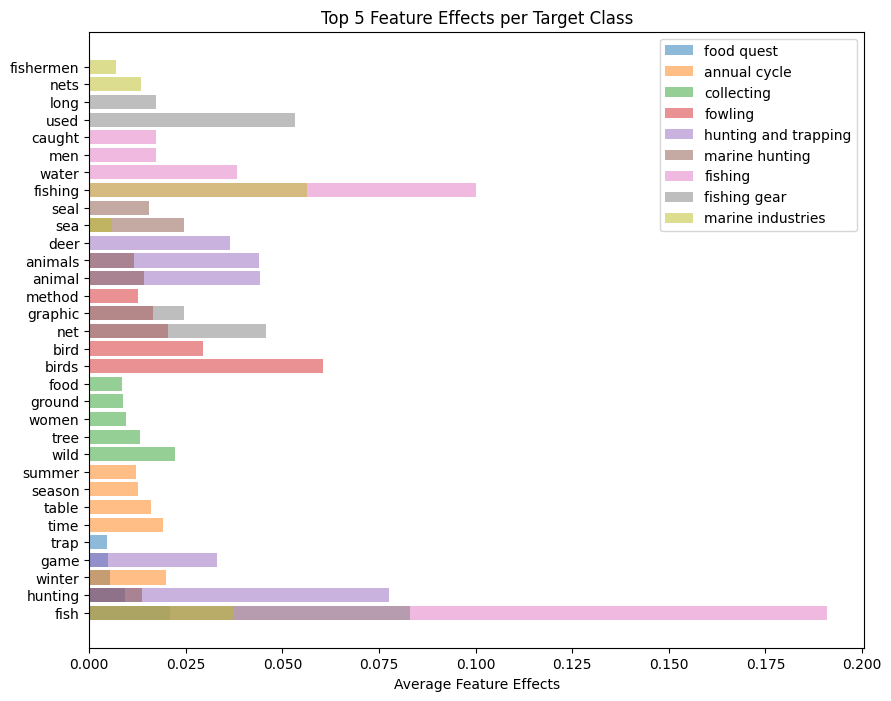

########## None RF 

########## Training RandomForestClassifier

########## 0.7442660550458715


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



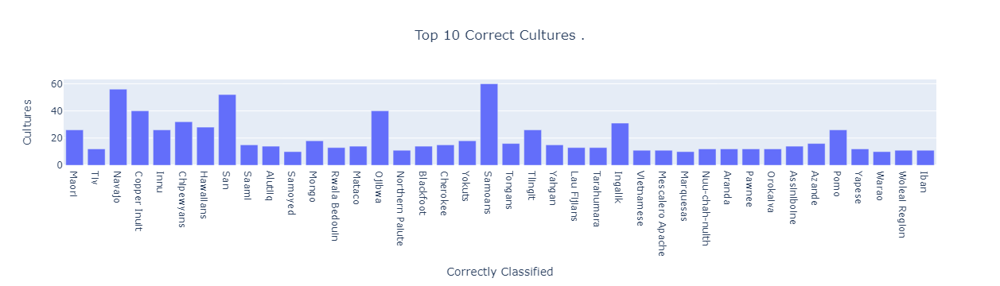

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


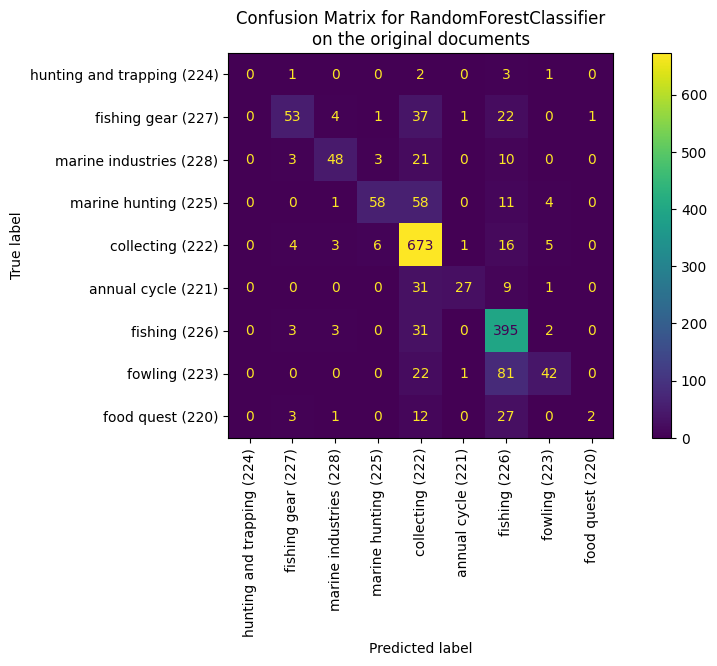

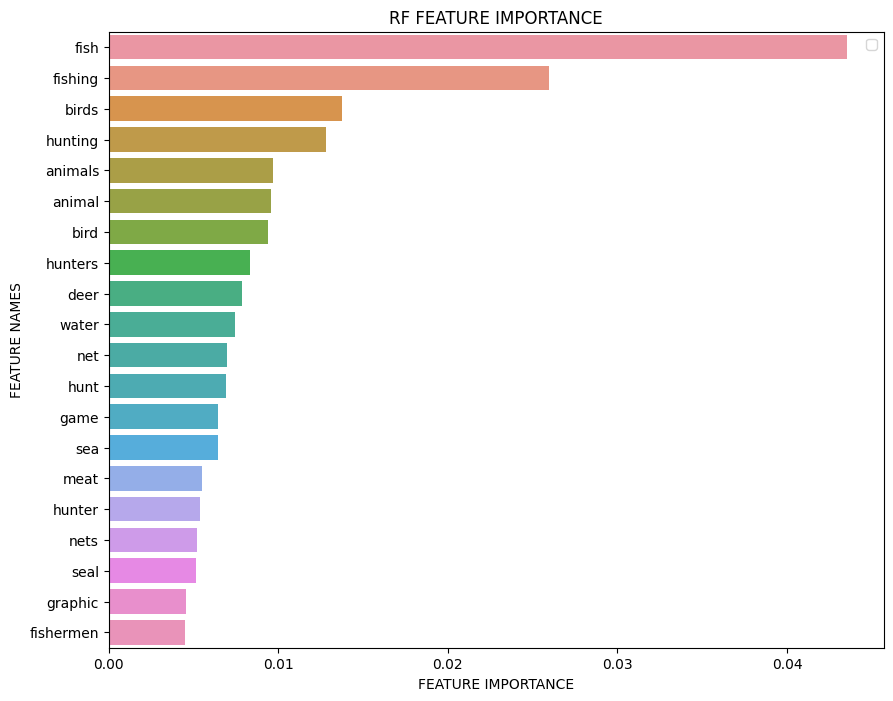

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 1.969s at 1.817MB/s
n_samples: 6546, n_features: 6404
n_samples: 1637, n_features: 6404


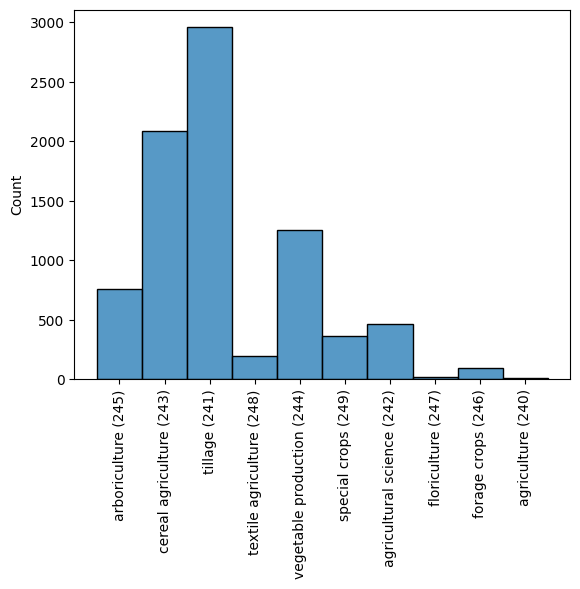

########## None LR 

########## Training LogisticRegression

########## 0.6713500305436775


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



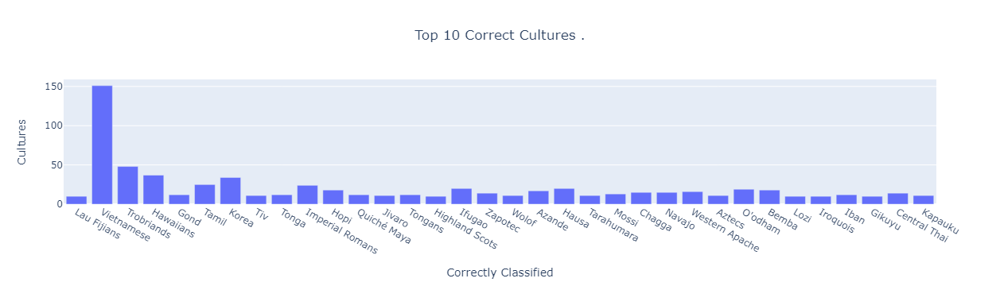

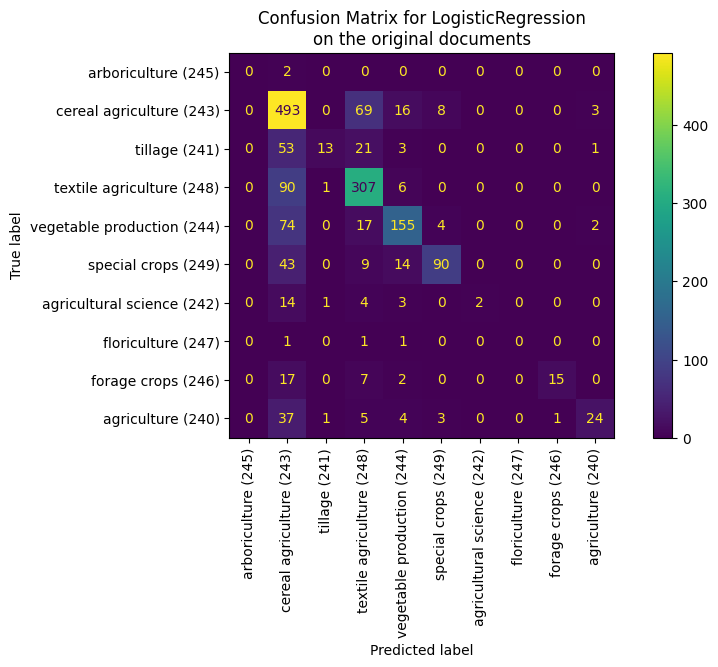

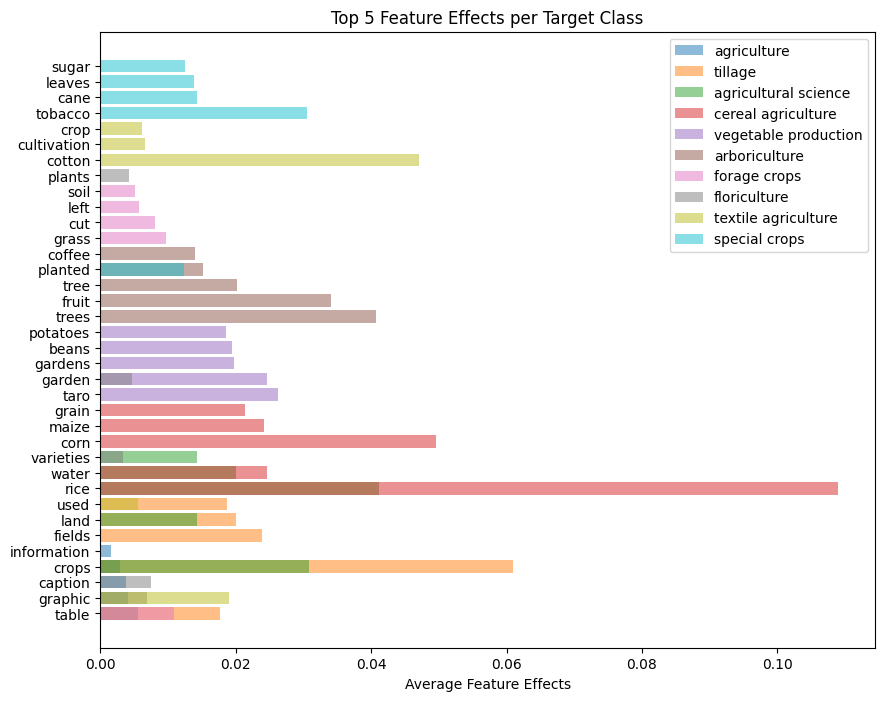

########## None RF 

########## Training RandomForestClassifier

########## 0.6481368356750152


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



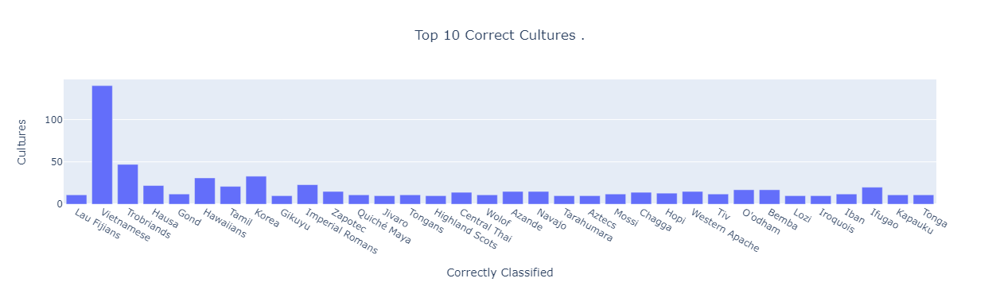

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


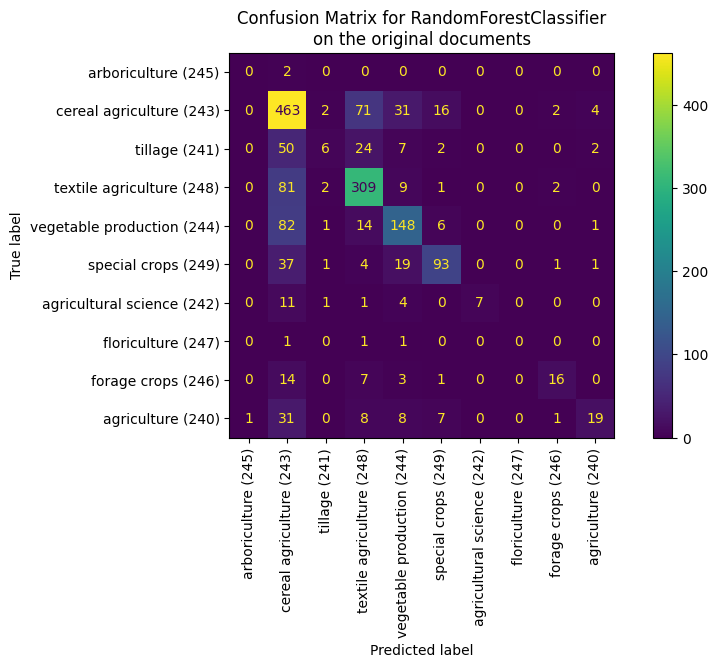

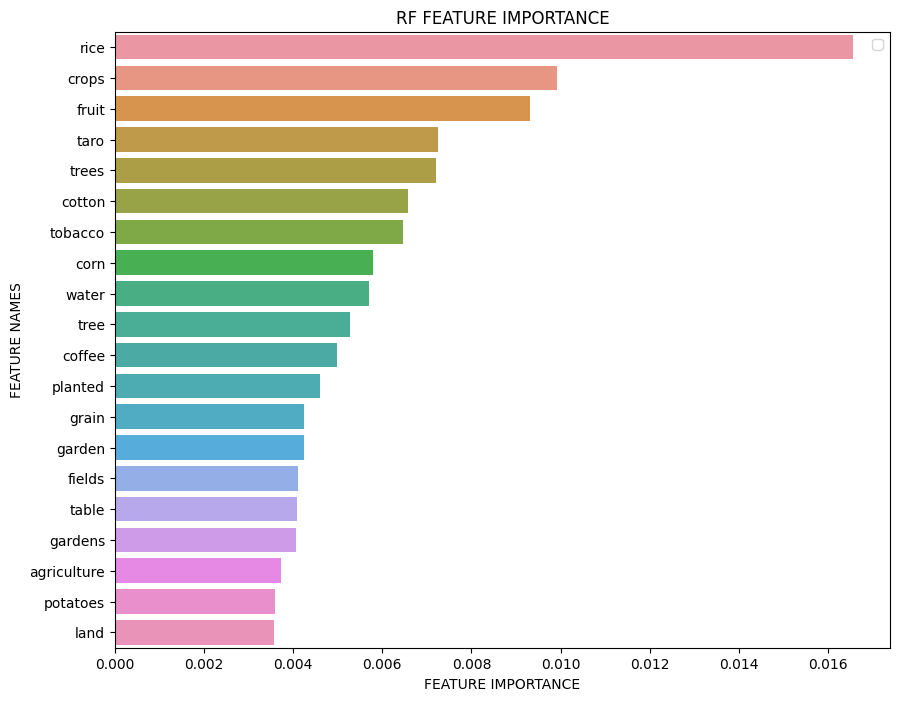

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



8183 documents - 3.58MB (training set)
10 categories
vectorize training done in 1.929s at 1.855MB/s
n_samples: 6546, n_features: 6404
n_samples: 1637, n_features: 6404


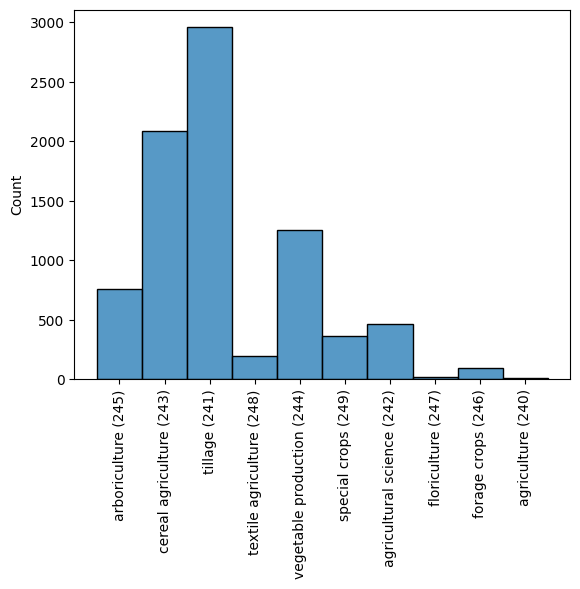

########## None LR 

########## Training LogisticRegression

########## 0.6682956627978008


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



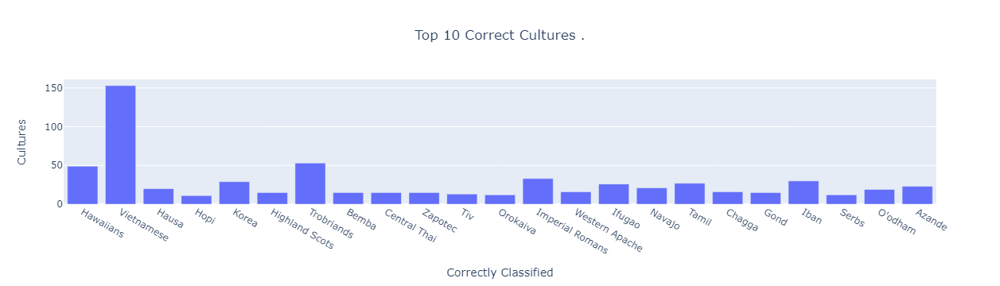

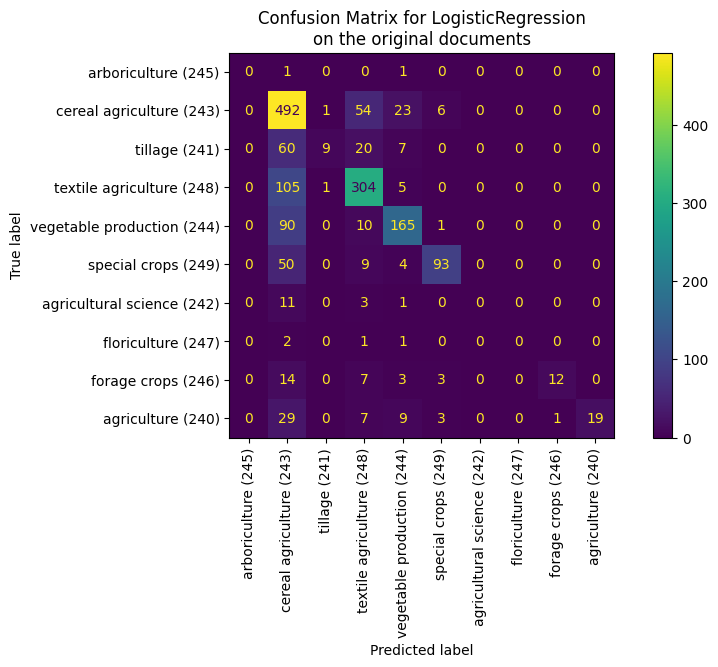

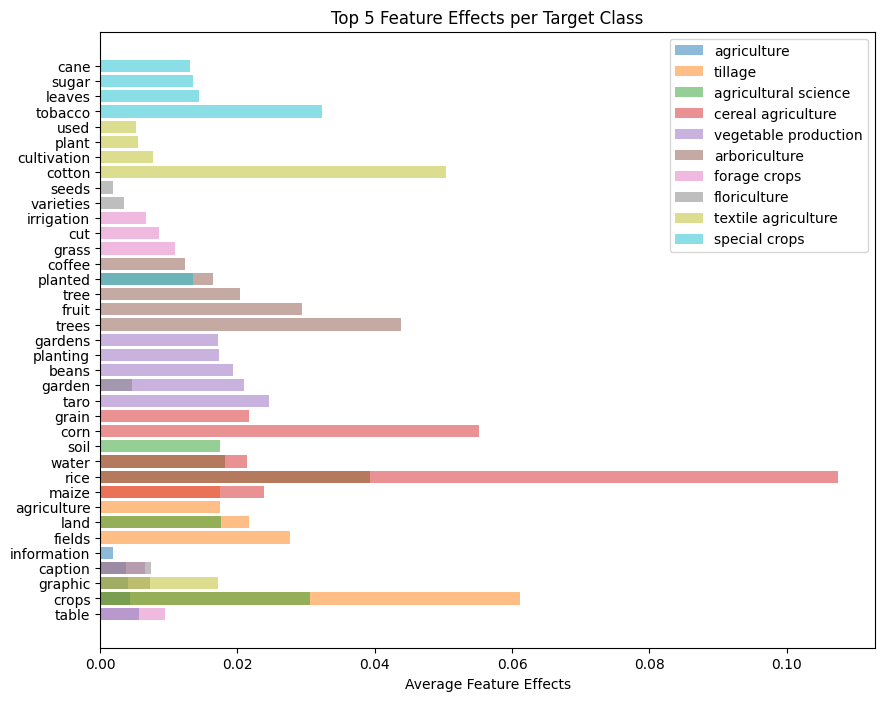

########## None RF 

########## Training RandomForestClassifier

########## 0.6481368356750152


C:\Users\alhas\Documents\development\masters-thesis\utils\plots.py:36: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


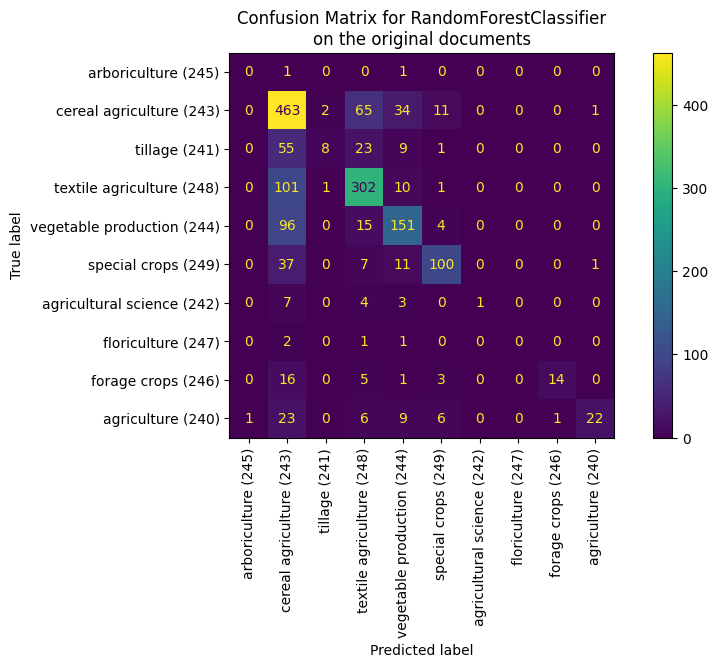

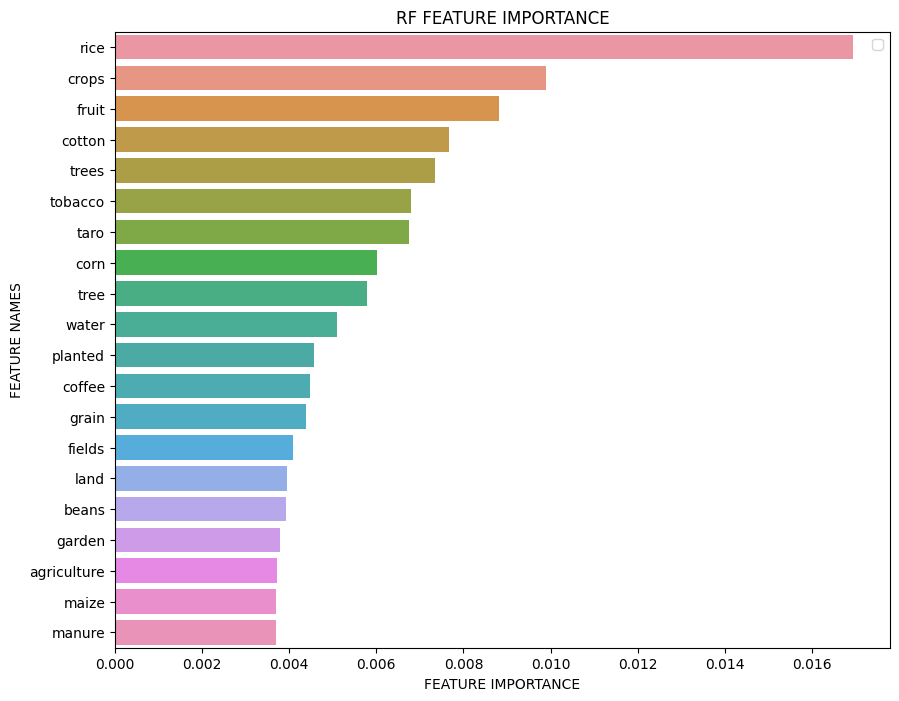

In [10]:

dfs = {}
for i in [224, 226, 241, 243]:
    df = run(models=['LR', 'RF'], specific_cat=i, exact=False, verbose=True)
    dfs[i] = df

- categorize features for each culture
- measure the sim between cultures based on these categories?
- this would allow comparing cultures based on the sim of these features across cultures based on some threshold (e.g. tfidf)
- they indicate the levels/types of the usage/facts of these cultures;
    - e.g. one culture is more advanced in using tools
    - e.g. en
    - 

# Archive

In [11]:
data = []
for i in [224, 226, 241, 243]:
    data.append(df[ df['ocms_list'].map(lambda x: len(x) == 1 and x[0] == i) ])
data = pd.concat(data)

<Axes: xlabel='ocms', ylabel='Count'>

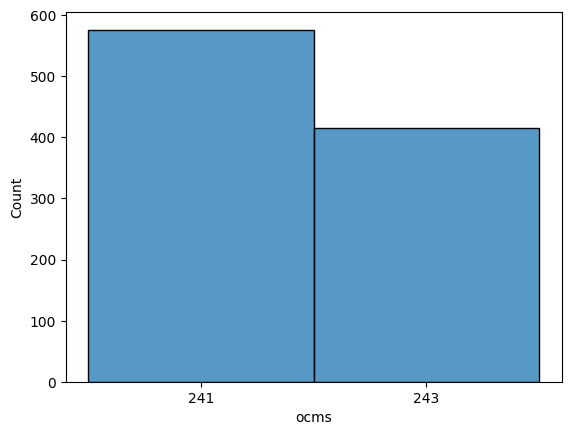

In [12]:
sns.histplot(data['ocms'])
# data.ocms.hist()

In [13]:
s = time.time()

tfidf_vec = TfidfVectorizer(min_df=3, # If a token appears fewer times than this, across all documents, it will be ignored
                             # tokenizer=nltk.word_tokenize, # we use the nltk tokenizer
                             tokenizer=preprocessing.tokenize_data, # we use the custom tokenizer
                             stop_words='english')#stopwords.words('english')) # stopwords are removed

tfidf_text = tfidf_vec.fit_transform(data['textrecord'])


e = time.time()
print("Elapsed time during the whole program in seconds:",
                                         e-s) 

C:\Users\alhas\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'



Elapsed time during the whole program in seconds: 0.31963658332824707


## Random Forest

In [14]:
# clf = RandomForestClassifier(random_state=0)
# # cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)

# param_grid = {"max_depth": [3, None],
#               "min_samples_split": [5, 10],}

# search = HalvingGridSearchCV(clf, param_grid, resource='n_estimators',
#                              max_resources=10,
#                              cv=5,
#                              random_state=0).fit(X_train, y_train)
# search.best_params_  # {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 9}

In [15]:
# search.best_estimator_.score(X_test, y_test)

In [16]:
# Train a Random Forest model
model = RandomForestClassifier(n_estimators=100)
model.fit(X_train, y_train)

NameError: name 'X_train' is not defined

In [ ]:
# cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3)

# n_scores = cross_val_score(model, 
#                            tfidf_text, data['parent_ocms'], 
#                            scoring='accuracy', 
#                            cv=cv, 
#                            n_jobs=-1, 
#                            error_score='raise')

In [ ]:

# print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

In [ ]:
# Evaluate the model on the testing set
accuracy = model.score(X_test, y_test)
print("Accuracy:", accuracy)

In [ ]:
preds = model.predict(X_test)
print(preds)

In [ ]:
plots.make_cm(model, preds, y_test, data['ocms'].uniqueque())

In [ ]:
report = classification_report(y_test, preds, digits = 3)
print(report)

In [ ]:
_test = df['textrecord'][SELECTED*2:SELECTED*3]
_test = text_vec.transform(_test)

In [ ]:
rf.predict(_test)[100:300]

In [ ]:
# Evaluate the model on the testing set
accuracy = rf.score(X_test, y_test)
print("Accuracy:", accuracy)

## Logisitc Regression

In [ ]:

pipe = make_pipeline(StandardScaler(with_mean=False), LogisticRegression(max_iter=10000))

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(tfidf_text, data['parent_ocms'], test_size=0.2)

In [ ]:
pipe.fit(X_train, y_train)

In [ ]:
pipe.score(X_test, y_test)

In [ ]:
clf.score(X_test, y_test)

In [ ]:
clf.score(X_test, y_test)

In [ ]:
clf.predict(X[:2, :])

In [ ]:
clf.predict_proba(X[:2, :]).shape

## KNN

In [ ]:
k_values = [i for i in range (1,31)]
scores = []

scaler = StandardScaler(with_mean=False)
X = scaler.fit_transform(X_train)

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    score = cross_val_score(knn, X, y_train, cv=5)
    scores.append(np.mean(score))

In [ ]:
sns.lineplot(x = k_values, y = scores, marker = 'o')
plt.xlabel("K Values")
plt.ylabel("Accuracy Score")

In [ ]:
pipe = make_pipeline(StandardScaler(with_mean=False),
                     KNeighborsClassifier(n_neighbors=16))

In [ ]:
pipe.fit(X_train, y_train)

In [ ]:
pipe.score(X_test, y_test)

In [ ]:
nlp = spacy.load("en_core_web_sm")

In [ ]:
# Define a function to preprocess a text record
def preprocess_text(text):
    doc = nlp(text)
    tokens = [token.lemma_.lower().strip() for token in doc 
              if not token.is_stop and not token.is_punct and token.lemma_ != '-PRON-']
    return tokens

In [ ]:
s = time.time()

# Apply the preprocess_text function to the textrecord column
df["processed_text"] = df["textrecord"].apply(preprocess_text)

    
e = time.time()


print("Elapsed time during the whole program in seconds:",
                                         e-s) 

In [ ]:
df.to_csv('data/splitted_preprocessed.csv')

In [ ]:
s = time.time()

nlp.pipe(df["textrecord"])


e = time.time()


print("Elapsed time during the whole program in seconds:",
                                         e-s) 

In [ ]:
# Preprocess data (e.g., remove missing values, encode categorical variables)

for doc in nlp.pipe(texts):
    # Do something with the doc here
    print([(ent.text, ent.label_) for ent in doc.ents])

    

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data.drop("dependency_strength", axis=1), data["dependency_strength"], test_size=0.2)

In [ ]:
# Train a Random Forest model
rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

In [ ]:
# Evaluate the model on the testing set
accuracy = rf.score(X_test, y_test)
print("Accuracy:", accuracy)

# Links
- https://www.datacamp.com/tutorial/random-forests-classifier-python
- https://machinelearningmastery.com/random-forest-ensemble-in-python/
- https://github.com/WillKoehrsen/Data-Analysis/tree/master/random_forest_explained
- https://www.kdnuggets.com/2017/06/7-techniques-handle-imbalanced-data.html
- https://towardsdatascience.com/methods-for-dealing-with-imbalanced-data-5b761be45a18
- **GREAT RESOURCE** https://scikit-learn.org/stable/auto_examples/text/plot_document_classification_20newsgroups.html#sphx-glr-auto-examples-text-plot-document-classification-20newsgroups-py
- https://scikit-learn.org/stable/modules/ensemble.html#subsampling